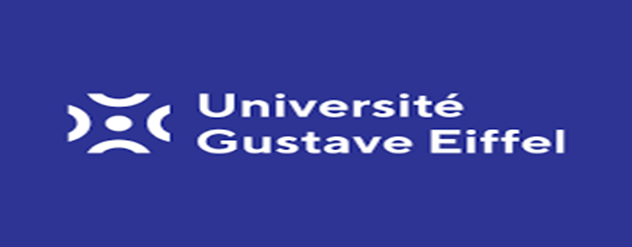

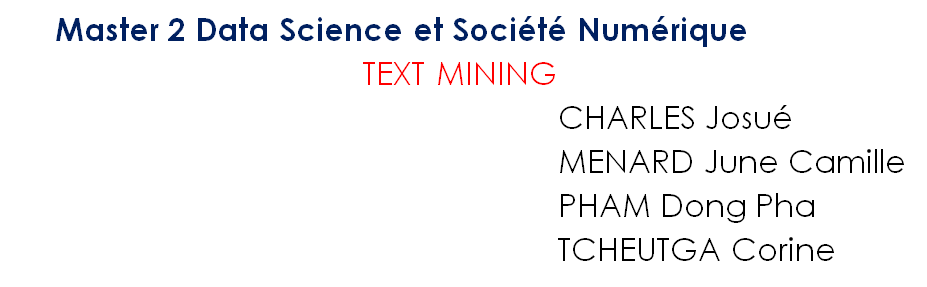


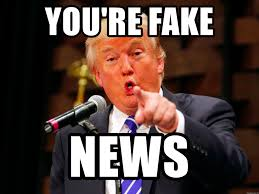

# TRAVAIL - DATASPRINT

## **News/Nouvelles**

Les nouvelles sont des informations sur les événements actuels dont la publication peut être assurée par les multiples médias différents: bouche à oreille, impression, systèmes postaux, télédiffusion, radiodiffusion, communication électronique ou par le biais du témoignage d'observateurs et de témoins d'événements.

Les sujets communs pour les reportages comprennent la guerre, le gouvernement, la politique, l'éducation, la santé, l'environnement, l'économie, les affaires, la mode et le divertissement, ainsi que les événements sportifs, les événements originaux ou inhabituels. Les proclamations gouvernementales, les cérémonies royales, l'éditions des lois, les impôts, la santé publique et les recherches criminelles. Les développements technologiques ont accéléré la diffusion des informations et influencé leur contenu. 


**Théorie du complot**

Théorie du complot (de même que les néologismes complotisme et conspirationnisme) est une expression d'origine anglaise, définie pour la première fois en 1945 par Karl Popper, qui dénonce comme abusive une hypothèse (en anglais theory) selon laquelle un événement politique a été causé par l'action concertée et secrète d'un groupe de personnes qui avaient intérêt à ce qu'il se produise, plutôt que par le déterminisme historique ou le hasard. Pour Peter Knight, de l'université de Manchester, cette théorie met en scène « un petit groupe de gens puissants qui se coordonnent en secret pour planifier et entreprendre une action illégale et néfaste affectant le cours des événements », afin d'obtenir ou de conserver une forme de pouvoir (politique, économique ou religieux).

**Fake News, en fait c’est quoi?**

Les fake news représentent une expression empruntée de l'anglais, en français fausses nouvelles, infox, ou encore informations fallacieuses  sont des informations mensongères diffusées dans le but de manipuler ou de tromper le public. Prenant une importance singulière à l'ère d'internet, elles peuvent émaner d'un ou de plusieurs individus (par le biais de médias non institutionnels comme les blogs ou les réseaux sociaux), d'un ou de plusieurs médias, d'un homme d'État ou d'un gouvernement. Les articles d'infox emploient souvent des titres accrocheurs ou des informations entièrement fabriquées en vue d'augmenter le nombre de lecteurs et de partages en ligne.


On peut souligner à partir des deux définitions que la dimension digitale/numérique de la propagation des Fakes News et tous les éléments qui y sont attachés (nombre de vue, de partage, etc...) représentent un facteur stratégique.

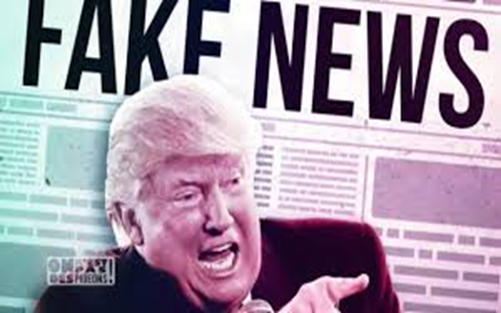

**Choix du sujet**

Nous nous sommes d'abord intéressés aux fakes News en général mais avec l'actualité du Covid et surtout très récemment les controverses autour des vaccins, nous avions voulu nous tourner vers ce sujet en nous basant sur la récolte des donées des publications sur YouTube. Mais grande surprise... NADA!!!
Ce qui nous a amener à nous questionner sur la censure des vidéos relatives au sujet sur YouTube. Y aurait-il de l'auto-censure ou est-ce Youtube en action? 
 

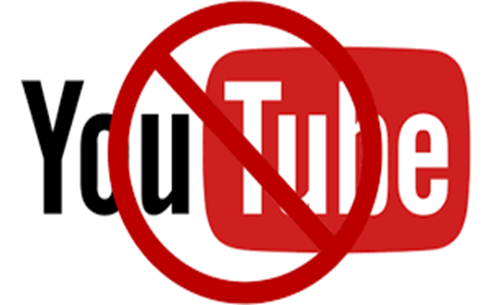

![image.gif](https://media.giphy.com/media/3baZCj3qCNK521Y57B/giphy.gif)

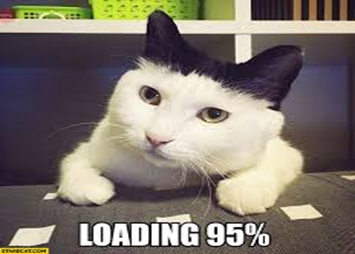

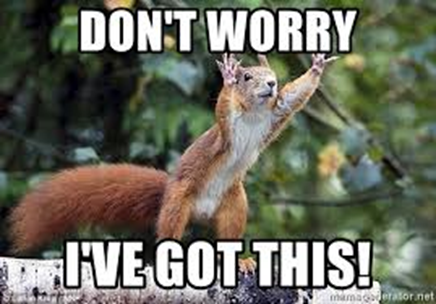

                                                                CHOIX FINAL

Novices, nous n'y avions pas pensé du premier coup, mais finalement nous avons trouvé un dataset sur Kaggle sur les Fake News et ayant pour titre Fake news and real news dataset qui est tombé à point et que nous utiliserons pour notre analyse. Nous avons quand même jugé pertinent de partager nos non-résultats relatifs à YouTube.


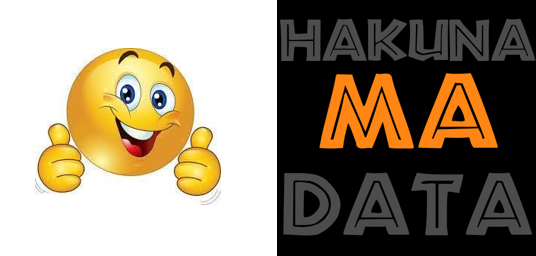

##   **CLASSIFIER INFO ET INFOX, EST-CE POSSIBLE?*

**Méthodologie**

Récupérer les bases de données

Analyses statistiques descriptives

Word cloud

Analyses statistiques  prédictives)

Conclusion et limites


In [483]:
import numpy as np 
import pandas as pd 

!pip install gensim 
import nltk
nltk.download('punkt')

import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import re
from nltk.corpus import stopwords
import seaborn as sns 
import gensim
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import STOPWORDS

import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\phamd\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [484]:
df_true = pd.read_csv("D:/Real_news.csv")
df_fake = pd.read_csv("D:/Fake_news.csv")

### Etablir une variable cible en combinant les datasets de Fake et Real news 

In [485]:
df_true['Cible'] = 1
df_fake['Cible'] = 0
df = pd.concat([df_true, df_fake]).reset_index(drop = True)
df['original'] = df['title'] + ' ' + df['text']
df.head()

,title,text,subject,date,Cible,original
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1,"As U.S. budget fight looms, Republicans flip t..."
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1,U.S. military to accept transgender recruits o...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1,Senior U.S. Republican senator: 'Let Mr. Muell...
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1,FBI Russia probe helped by Australian diplomat...
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1,Trump wants Postal Service to charge 'much mor...


## Nettoyage des données

In [486]:
df.isnull().sum()

title       0
text        0
subject     0
date        0
Cible       0
original    0
dtype: int64

In [487]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\phamd\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [488]:
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])
def preprocess(text):
    result = []
    for token in gensim.utils.simple_preprocess(text):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 2 and token not in stop_words:
            result.append(token)
            
    return result

In [489]:
# Transforming the unmatching subjects to the same notation
df.subject=df.subject.replace({'politics':'PoliticsNews','politicsNews':'PoliticsNews'})

### Sujets ayant reçu une plus grande couverture médiatique

### Répartition des sujets entre Real news et Fake news

In [490]:
sub_tf_df=df.groupby('Cible').apply(lambda x:x['title'].count()).reset_index(name='Nombre')
sub_tf_df.Cible.replace({0:'Fake_news',1:'Real_news'},inplace=True)
fig = px.bar(sub_tf_df, x="Cible", y="Nombre",
             color='Nombre', barmode='group',
             height=400)
fig.update_traces(marker_color='gray')
fig.show()

## Nombre de publications par sujet

In [491]:
sub_check=df.groupby('subject').apply(lambda x:x['title'].count()).reset_index(name='Nombre')
fig=px.bar(sub_check,x='subject',y='Nombre',color='Nombre',title='Nombre de publications par sujet')
fig.update_traces(marker_color='gray')
fig.show()

### Selon les données récoltées on peut observer une position dominante de Politics News et World News.

### Tentons de prédire les Fake et Real news à partir des Titres des articles

In [492]:
df['clean_title'] = df['title'].apply(preprocess)
df['clean_title'][0]

['budget', 'fight', 'looms', 'republicans', 'flip', 'fiscal', 'script']

In [493]:
df['clean_joined_title']=df['clean_title'].apply(lambda x:" ".join(x))

## Word Cloud tiré des titres des Real news

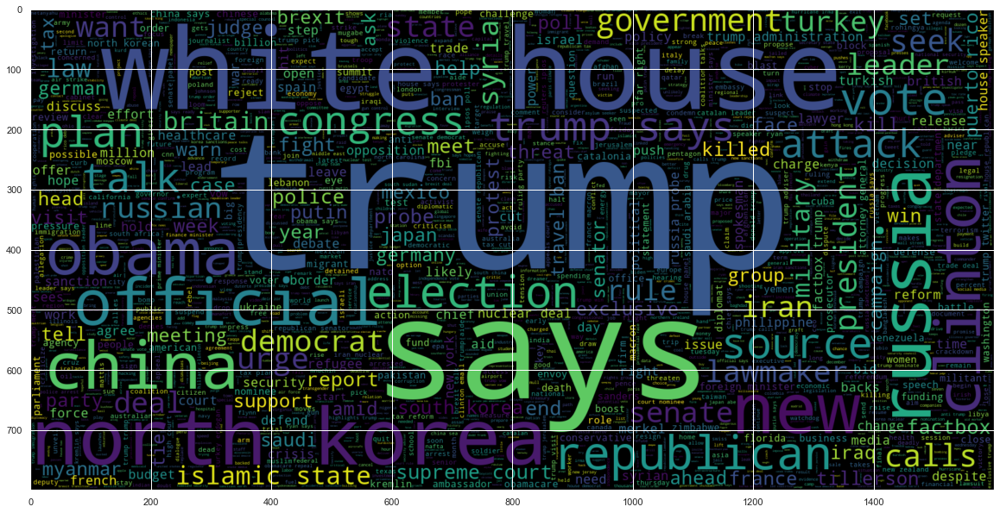

In [494]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.Cible == 1].clean_joined_title))
plt.imshow(wc, interpolation = 'bilinear')

## Word Cloud tiré des titres des Fake news

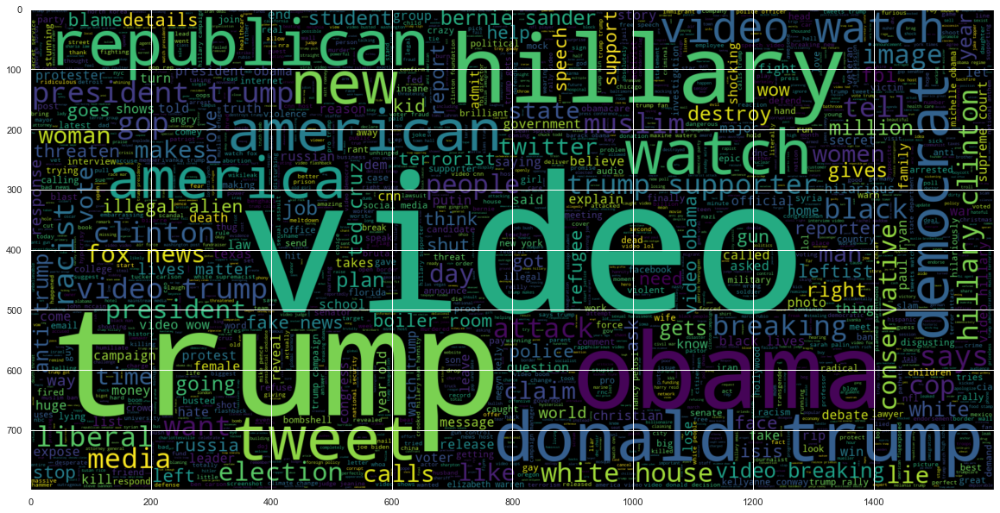

In [495]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.Cible == 0].clean_joined_title))
plt.imshow(wc, interpolation = 'bilinear')

In [496]:
maxlen = -1
for doc in df.clean_joined_title:
    tokens = nltk.word_tokenize(doc)
    if(maxlen<len(tokens)):
        maxlen = len(tokens)
print("Le nombre maximal de mots par titre est:", maxlen)
fig = px.histogram(x = [len(nltk.word_tokenize(x)) for x in df.clean_joined_title], nbins = 50)
fig.show()

Le nombre maximal de mots par titre est: 34


### On observe une domination des titres allant de 7 à 8 mots. Motif: Suffisament explicites et percutants pourrait-on suppposer (Marché de l'attention).

## Prédiction Real News-Fake news à partir des titres 

In [497]:
X_train, X_test, y_train, y_test = train_test_split(df.clean_joined_title, df.Cible, test_size = 0.2,random_state=2)
vec_train = CountVectorizer().fit(X_train)
X_vec_train = vec_train.transform(X_train)
X_vec_test = vec_train.transform(X_test)

In [498]:
model = LogisticRegression(C=2)
model.fit(X_vec_train, y_train)
predicted_value = model.predict(X_vec_test)
accuracy_value = roc_auc_score(y_test, predicted_value)
print(accuracy_value)

0.9475943910154114


### Nous pouvons observer une exactitude de 95% de la prédiction

## Matrice de confusion

<AxesSubplot:>

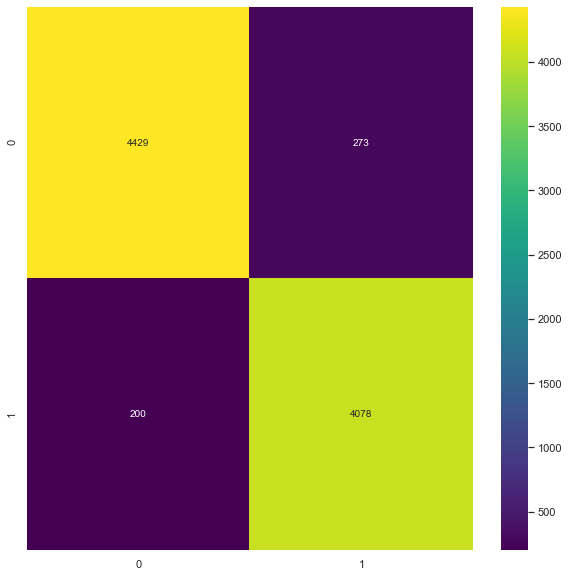

In [499]:
cm = confusion_matrix(list(y_test), predicted_value)
plt.figure(figsize = (10, 10))
sns.heatmap(cm, annot = True,fmt='g',cmap='viridis')

### On peut constater que 4465 Fakes news ont été classées comme Fake, tandis que 4045 Real news ont été classées comme Real! 
### Avec 470 titres mal classés.


### Voir si le contenu des nouvelles suffirait pour prédire si celles-ci sont Fakes ou Real.


In [500]:
df['clean_text'] = df['text'].apply(preprocess)
df['clean_joined_text']=df['clean_text'].apply(lambda x:" ".join(x))

## Word cloud à partir du contenu des Fake news

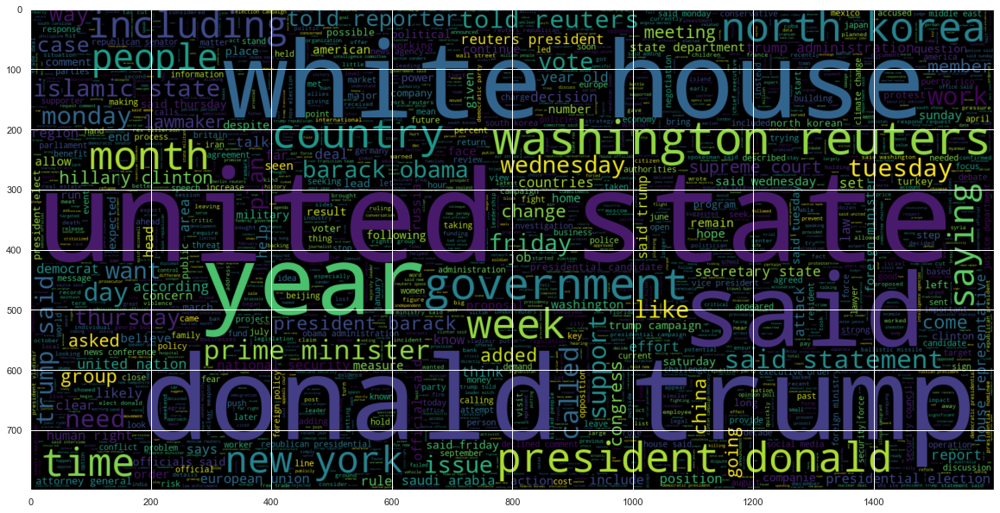

In [501]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.Cible == 1].clean_joined_text))
plt.imshow(wc, interpolation = 'bilinear')


## Word cloud à partir des contenus des Real news

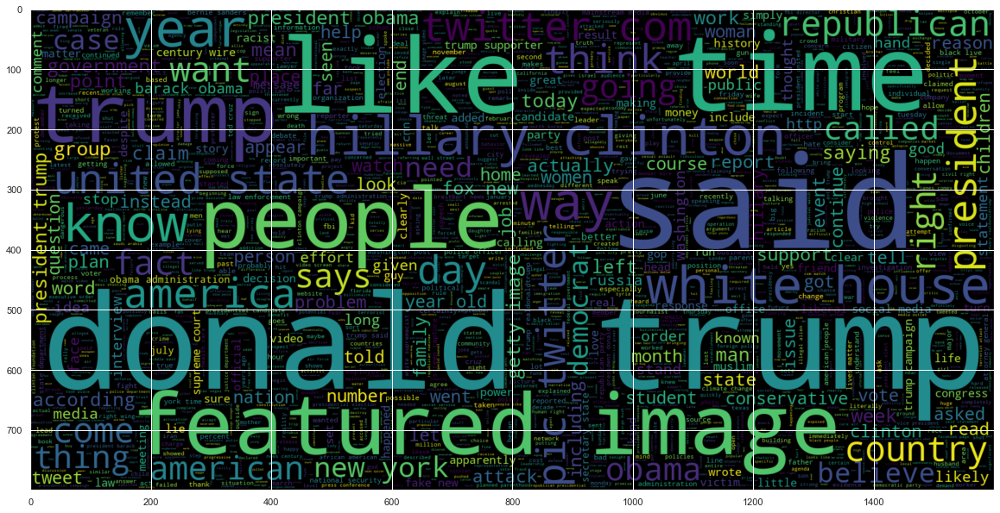

In [502]:
plt.figure(figsize = (20,20)) 
wc = WordCloud(max_words = 2000 , width = 1600 , height = 800 , stopwords = stop_words).generate(" ".join(df[df.Cible == 0].clean_joined_text))
plt.imshow(wc, interpolation = 'bilinear')

## Repartion des mots

In [503]:
maxlen = -1
for doc in df.clean_joined_text:
    tokens = nltk.word_tokenize(doc)
    if(maxlen<len(tokens)):
        maxlen = len(tokens)
print("Le nombre moyen de mots dans une publication est de:", maxlen)
fig = px.histogram(x = [len(nltk.word_tokenize(x)) for x in df.clean_joined_text], nbins = 50)
fig.show()

Le nombre moyen de mots dans une publication est de: 4573


### Nous pouvons observer que la plupart des articles de presse sont compris entre 100 et 200 mots. Tout ce qui dépasse ce point semble moins accrocheur.

In [26]:

X_train, X_test, y_train, y_test = train_test_split(df.clean_joined_text, df.Cible, test_size = 0.2,random_state=2)
vec_train = CountVectorizer().fit(X_train)
X_vec_train = vec_train.transform(X_train)
X_vec_test = vec_train.transform(X_test)
model = LogisticRegression(C=2.5)
model.fit(X_vec_train, y_train)
predicted_value = model.predict(X_vec_test)
accuracy_value = roc_auc_score(y_test, predicted_value)
print(accuracy_value)

0.9953661308915527


C:\Users\phamd\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



### Observation WoooW! 99,53% C'est une nette amélioration. Bien mieux que de prévoir à partir des titres. En effet, il est bien dit de ne jamais juger un livre par sa couverture, ni une actualité par son titre. Avoir une si grande précision permet pour une fois de jeter un coup d'œil dans la matrice de confusion

## Matrice de confusion

<AxesSubplot:>

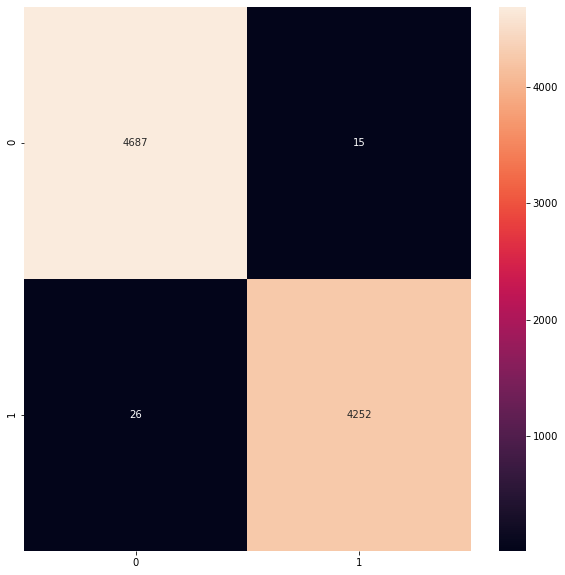

In [27]:
prediction = []
for i in range(len(predicted_value)):
    if predicted_value[i].item() > 0.5:
        prediction.append(1)
    else:
        prediction.append(0)
cm = confusion_matrix(list(y_test), prediction)
plt.figure(figsize = (10, 10))
sns.heatmap(cm, annot = True,fmt='g')

### On peut observer que 4688 des contenus des Fake news ont été classées comme faux, tandis que 4259 des Real news ont également été prédits à juste titre avec 33 de l'ensemble ayant été mal classées. On constate donc une nette amélioration par rapport à notre premier modèle. 

## Evaluation de la prédiction de l'intégralité des publications. Titres et contenus.

In [28]:
df['clean_final'] = df['original'].apply(preprocess)
df['clean_joined_final']=df['clean_final'].apply(lambda x:" ".join(x))

In [29]:
X_train, X_test, y_train, y_test = train_test_split(df.clean_joined_final, df.Cible, test_size = 0.2,random_state=0)
vec_train = CountVectorizer().fit(X_train)
X_vec_train = vec_train.transform(X_train)
X_vec_test = vec_train.transform(X_test)
model = LogisticRegression(C=3)
model.fit(X_vec_train, y_train)
predicted_value = model.predict(X_vec_test)
accuracy_value = roc_auc_score(y_test, predicted_value)
print(accuracy_value)

0.9966717508706907


C:\Users\phamd\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



## On peut observer que la prédiction a une accuracy de 99+% quand le titre et le contenu des publications sont considérés.

## Matrice de confusion

<AxesSubplot:>

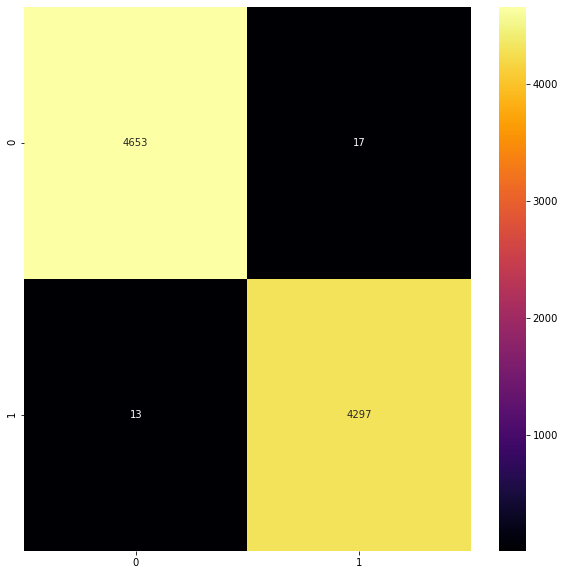

In [30]:
prediction = []
for i in range(len(predicted_value)):
    if predicted_value[i].item() > 0.5:
        prediction.append(1)
    else:
        prediction.append(0)
cm = confusion_matrix(list(y_test), prediction)
plt.figure(figsize = (10, 10))
sns.heatmap(cm, annot = True,fmt='g',cmap='inferno')

## Conclusion

Nouspouvons donc considérer que l'objectif de classification est atteint ce qui nous met en position d'identifier une Fake tout comme une Real news. 
### Points à souligner:
On ne peut prédire avec une grande fiabilité la classification des nouvelles uniquement à partir de leurs titres. 
Une bien meilleure fiabilité a été obtenue lorsque le contexte intégral (titre et contenu) de l'article est considéré. Les pourcentages de précision sont passés de 94% à 99 +%. 


## **Limites**

### Les articles ayant été publiés par des sources multiples et diverses, et sur un très grand nombre de sujets, l'analyse de sentiments ne sera d'aucune pertinence pour ce dataset. Notre modèle étant d'un niveau de fiabilité élevé, la seule chose qu'il reste à dire est...

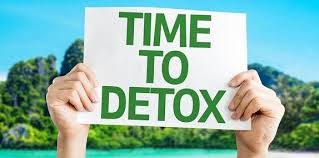

![image.gif](https://media.giphy.com/media/2kS9kWWNokd2v0XWN2/giphy.gif)

# TRAVAIL - TEXT MINING


Dans cette partie, nous allons approfondir notre analyse en faisant du text mining, une liste non-exhaustive des différentes étapes de notre analyse est élaborée en table des matières.

### Table des matières                 

•	Quelques éléments statistiques

•	Visualisation en nuage de mots

•	Distribution par sujet

•	Longueur du texte

•	Prétraitement et nettoyage des données

•	Nombre de mots

•	Nombre de caractères

•	Calcul des Stopwords

•	Calcul et suppression des e-mails

•	Compter et supprimer les URL

•	Suppression des Retweets

•	Suppression des caractères spéciaux ou de la ponctuation

•	Suppression des espaces multiples

•	Suppression des balises

•	Suppression des caractères accentués

•	Suppression des Stopwords

•	Conversion en forme de base ou racine de mot

•	Suppression des mots courants

•	Suppression des mots rares

•	Récupération des mots courants

•	Lemmatisation

•	Nettoyage des Fake news avec Word2vec et LSTM

•	Prétraitement de texte

•	Vectorisation - Word2Vec

•	Modèles d'apprentissage automatique pour la classification de texte

•	Bag of Words (BoW)

•	Machine learning – Algorithmes

•	TFIDF

•   Analyse N-gramme

•	Trouvons les mots courants

•	Topic Modeling avec Genism (LDA)

•	Classification des Fake News - Analyse et modélisation

•	Machine Learning et modélisation

•	Deep learning et modélisation

•	Réseau de neurones dense régulier

•	Réseau neuronal récurrent - LSTM

•	Modélisation sur le titre

•	Conclusion



### Quelques éléments statistiques

### Importons les librairies

In [49]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import feature_extraction, linear_model, model_selection, preprocessing
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score, confusion_matrix, \
                            classification_report, f1_score, roc_curve, auc
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.gaussian_process import GaussianProcessClassifier
from keras.models import Model
from keras.layers import LSTM, Activation, Dense, Dropout, Input, Embedding
from keras.optimizers import RMSprop
from keras.preprocessing.text import Tokenizer
from keras.preprocessing import sequence
from keras.callbacks import EarlyStopping
from wordcloud import WordCloud
from collections import Counter, defaultdict

import nltk
import nltk as nlp
import string
import re
true = pd.read_csv("D:/Real_news.csv")
fake = pd.read_csv("D:/Real_news.csv")

In [50]:
fake['target'] = 'fake'
true['target'] = 'true'
newstot = pd.concat([fake, true]).reset_index(drop = True)
newstot.head()

,title,text,subject,date,target
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",fake
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",fake
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",fake
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",fake
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",fake


In [51]:
# Groupons par sujets 
for key,count in fake.subject.value_counts().iteritems():
    print(f"{key}:\t{count}")
    
#Total
print(f"Total:\t{fake.shape[0]}")


politicsNews:	11272
worldnews:	10145
Total:	21417


In [52]:
# Groupons par sujects 
for key,count in true.subject.value_counts().iteritems():
    print(f"{key}:\t{count}")
    
# Le Total
print(f"Total Records:\t{true.shape[0]}")

politicsNews:	11272
worldnews:	10145
Total Records:	21417


C:\Users\phamd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


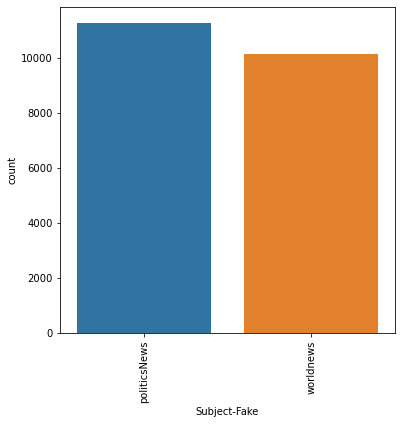

C:\Users\phamd\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


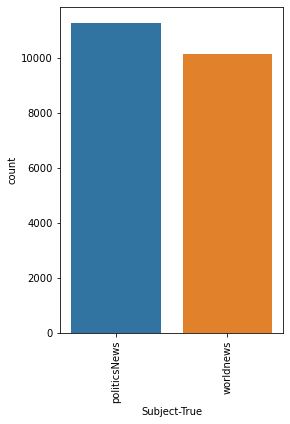

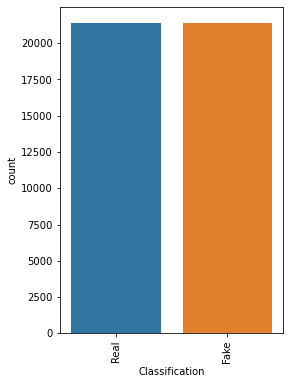

In [53]:
fake['fake'] = 1
true['fake'] = 0

df = pd.concat([fake, true], ignore_index=True)


plt.figure(figsize=(6,6))
sns.countplot("subject", data=fake)
plt.xticks(rotation=90)
plt.xlabel('Subject-Fake')
plt.show()


plt.figure(figsize=(4,6))
sns.countplot("subject", data=true)
plt.xticks(rotation=90)
plt.xlabel('Subject-True')
plt.show()



plt.figure(figsize=(4,6))
ax = sns.countplot(x="fake", data=data_df)
ax.set_xticklabels(['Real', 'Fake'])
plt.xlabel('Classification')
plt.xticks(rotation=90)
plt.show()

C:\Users\phamd\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\phamd\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


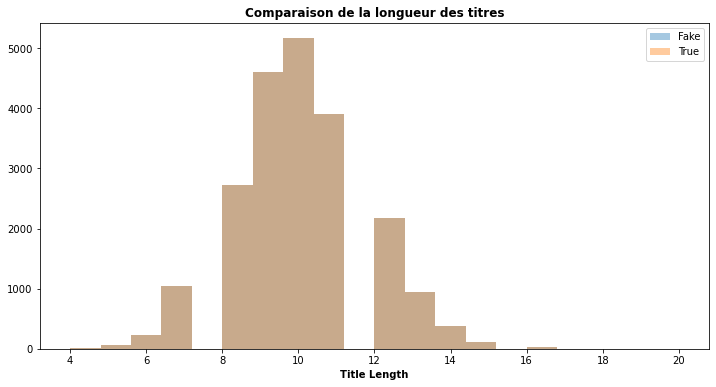

In [54]:
df['title_length'] = data_df['title'].apply(lambda x : len(x.strip().split()))
df['text_length'] = data_df['text'].apply(lambda x : len(x.strip().split()))


plt.figure(figsize=(12,6))
sns.distplot(data_df[data_df['fake'] == 1]['title_length'], 
             kde=False, label='Fake', bins=20)
sns.distplot(data_df[data_df['fake'] == 0]['title_length'], 
             kde=False, label='True', bins=20)
plt.xlabel('Title Length', weight='bold')
plt.title('Comparaison de la longueur des titres', weight='bold')
plt.legend()
plt.show()

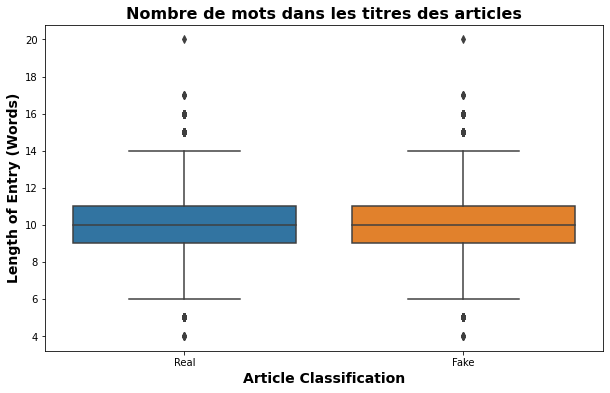

In [55]:
fig = plt.figure(figsize=(10, 6))
plt.title("Nombre de mots dans les titres des articles", fontsize=16, weight='bold')
ax = sns.boxplot(x="fake", y="title_length", data=data_df)
ax.set_xticklabels(['Real', 'Fake'])
ax.set_xlabel("Article Classification", fontsize=14, weight='bold') 
ax.set_ylabel("Length of Entry (Words)", fontsize=14, weight='bold')
plt.show()

C:\Users\phamd\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\phamd\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


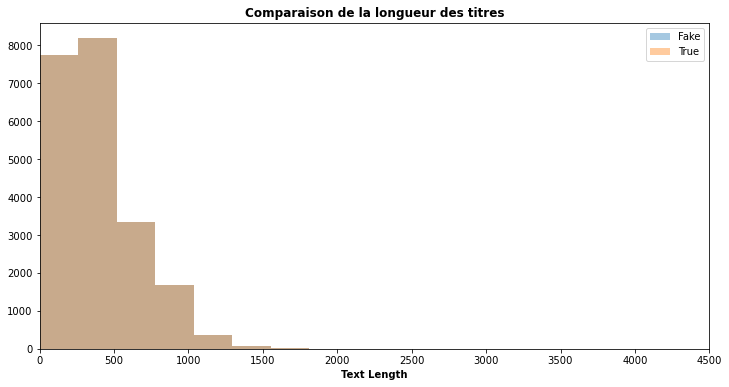

In [56]:
plt.figure(figsize=(12,6))
sns.distplot(data_df[data_df['fake'] == 1]['text_length'], 
             kde=False, label='Fake', bins=20)
sns.distplot(data_df[data_df['fake'] == 0]['text_length'], 
             kde=False, label='True', bins=20)
plt.xlabel('Text Length', weight='bold')
plt.title('Comparaison de la longueur des titres', weight='bold')
plt.xlim(0.0, 4500)
plt.legend()
plt.show()

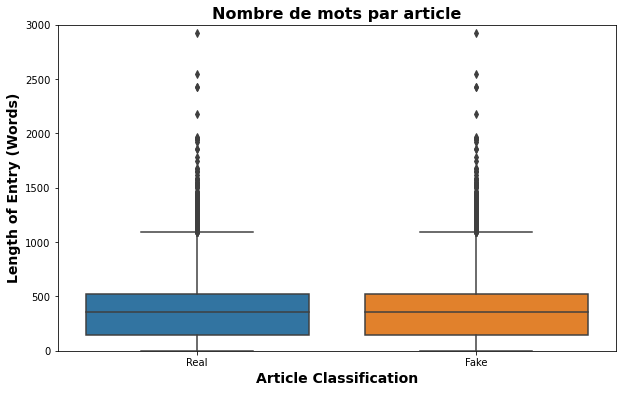

In [57]:
fig = plt.figure(figsize=(10, 6))
plt.title("Nombre de mots par article", fontsize=16, weight='bold')
ax = sns.boxplot(x="fake", y="text_length", data=data_df)
ax.set_xticklabels(['Real', 'Fake'])
ax.set_xlabel("Article Classification", fontsize=14, weight='bold') 
ax.set_ylabel("Length of Entry (Words)", fontsize=14, weight='bold')
plt.ylim(0.0, 3000.0)
plt.show()

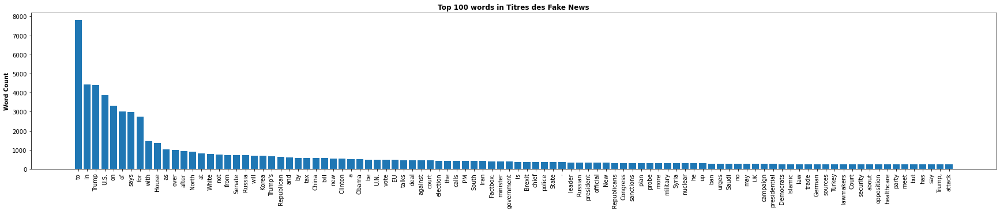

Total de mots uniques dans title: 22861


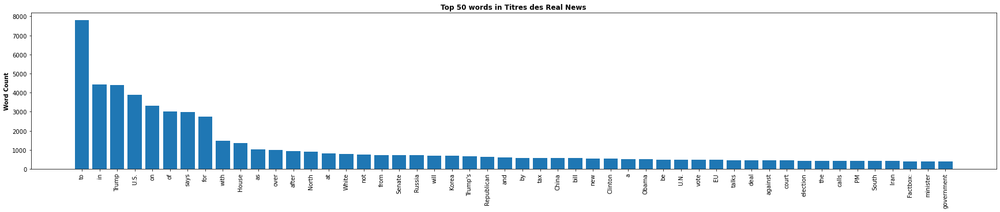

Total de mots uniques dans title: 22861


In [58]:
def create_corpus(text_data):
    """ Creation du corpus """
    corpus = []
    for sentence in text_data:
        for word in sentence.split():
            corpus.append(word)
    return corpus
            
def top_words(text_corpus, top_n=25, return_dict=False):
    """ Récurrence """
    def_dict = defaultdict(int)
    for word in text_corpus:
        def_dict[word] += 1
    most_common = sorted(def_dict.items(), key=lambda x : x[1], reverse=True)[:top_n]
    if return_dict:
        return most_common, def_dict
    else:    
        return most_common


top_n = 100
text_field = "title"

fake_corpus = create_corpus(fake[text_field].values)
fake_top_n_words, fake_symptom_dict = top_words(fake_corpus, top_n=top_n, return_dict=True)
fake_words, fake_word_counts = zip(*fake_top_n_words)

def plot_words(word_list, word_counts, n, text_description, figsize=(30,5)):
    plt.figure(figsize=figsize)
    plt.xticks(rotation=90)
    plt.bar(word_list, word_counts)
    plt.title(f"Top {n} words in {text_description}", weight='bold')
    plt.ylabel("Word Count", weight='bold')
    plt.show()

plot_words(fake_words, fake_word_counts, 100, "Titres des Fake News")
print(f"Total de mots uniques dans {text_field}: {len(fake_symptom_dict)}")


top_n = 50
text_field = "title"

true_corpus = create_corpus(true[text_field].values)
true_top_n_words, true_symptom_dict = top_words(true_corpus, top_n=top_n, return_dict=True)
true_words, true_word_counts = zip(*true_top_n_words)

plot_words(true_words, true_word_counts, 50, "Titres des Real News")
print(f"Total de mots uniques dans {text_field}: {len(true_symptom_dict)}")


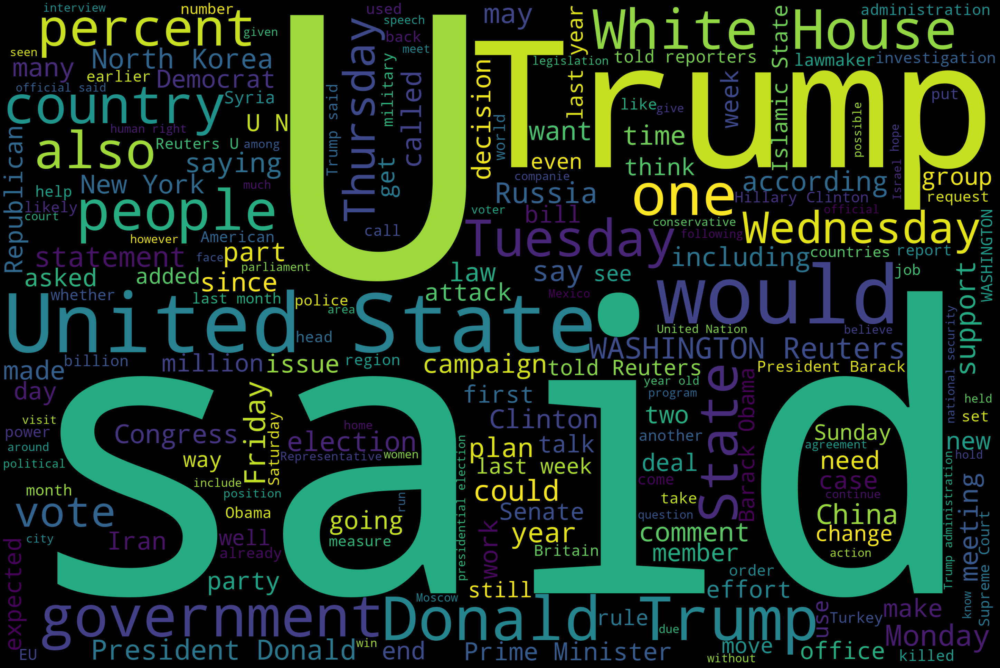

In [59]:
# Premier Word Cloud
text = ''
for news in fake.text.values:
    text += f" {news}"
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = set(nltk.corpus.stopwords.words("english"))).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()
del text

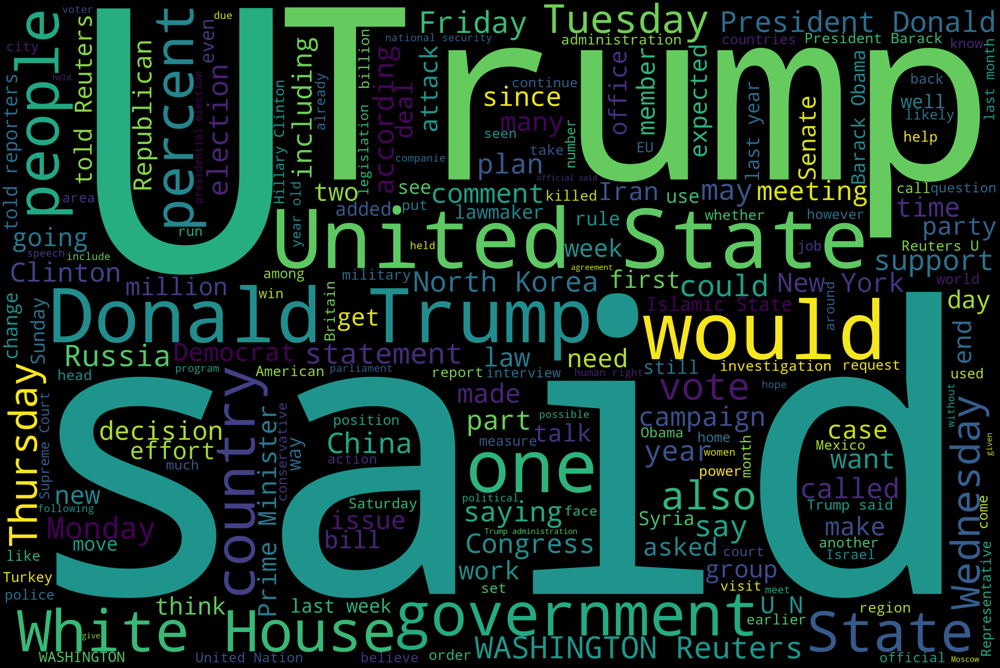

In [60]:
# Deuxième Word Cloud
text = ''
for news in true.text.values:
    text += f" {news}"
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = 'black',
    stopwords = set(nltk.corpus.stopwords.words("english"))).generate(text)
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()
del text

In [73]:
# Fonction pour supprimer les balises
def remove_tags(string):
    result = re.sub('<.*?>','',string)
    return result
# Enlevons les balises
df['title'] = df['title'].apply(lambda x : remove_tags(x))
df['text'] = df['text'].apply(lambda x : remove_tags(x))
df['subject'] = df['subject'].apply(lambda x : remove_tags(x))


In [74]:
# Eliminons les nombres
def remove_number(data):
    output = ''.join(c for c in data if not c.isnumeric())
    return output

df['title']=df['title'].apply(lambda x : remove_number(x))
df['text']=df['text'].apply(lambda x : remove_number(x))
df['subject']=df['subject'].apply(lambda x : remove_number(x))


In [75]:
contractions_dict = { "ain't": "are not","'s":" is","aren't": "are not",    
                     "can't": "cannot","can't've": "cannot have",
                     "'cause": "because","could've": "could have","couldn't": "could not",
                     "couldn't've": "could not have", "didn't": "did not","doesn't": "does not",
                     "don't": "do not","hadn't": "had not","hadn't've": "had not have",
                     "hasn't": "has not","haven't": "have not","he'd": "he would",
                     "he'd've": "he would have","he'll": "he will", "he'll've": "he will have",
                     "how'd": "how did","how'd'y": "how do you","how'll": "how will",
                     "I'd": "I would", "I'd've": "I would have","I'll": "I will",
                     "I'll've": "I will have","I'm": "I am","I've": "I have", "isn't": "is not",
                     "it'd": "it would","it'd've": "it would have","it'll": "it will",
                     "it'll've": "it will have", "let's": "let us","ma'am": "madam",
                     "mayn't": "may not","might've": "might have","mightn't": "might not", 
                     "mightn't've": "might not have","must've": "must have","mustn't": "must not",
                     "mustn't've": "must not have", "needn't": "need not",
                     "needn't've": "need not have","o'clock": "of the clock","oughtn't": "ought not",
                     "oughtn't've": "ought not have","shan't": "shall not","sha'n't": "shall not",
                     "shan't've": "shall not have","she'd": "she would","she'd've": "she would have",
                     "she'll": "she will", "she'll've": "she will have","should've": "should have",
                     "shouldn't": "should not", "shouldn't've": "should not have","so've": "so have",
                      "that'd": "that would","that'd've": "that would have", "there'd": "there would",
                     "there'd've": "there would have", "they'd": "they would",
                     "they'd've": "they would have","they'll": "they will",
                     "they'll've": "they will have", "they're": "they are","they've": "they have",
                     "to've": "to have","wasn't": "was not","we'd": "we would",
                     "we'd've": "we would have","we'll": "we will","we'll've": "we will have",
                     "we're": "we are","we've": "we have", "weren't": "were not","what'll": "what will",
                     "what'll've": "what will have","what're": "what are", "what've": "what have",
                     "when've": "when have","where'd": "where did", "where've": "where have",
                     "who'll": "who will","who'll've": "who will have","who've": "who have",
                     "why've": "why have","will've": "will have","won't": "will not",
                     "won't've": "will not have", "would've": "would have","wouldn't": "would not",
                     "wouldn't've": "would not have","y'all": "you all", "y'all'd": "you all would",
                     "y'all'd've": "you all would have","y'all're": "you all are",
                     "y'all've": "you all have", "you'd": "you would","you'd've": "you would have",
                     "you'll": "you will","you'll've": "you will have", "you're": "you are",
                     "you've": "you have"}

In [76]:
# Elimination des contractions
contractions_re=re.compile('(%s)' % '|'.join(contractions_dict.keys()))
def expand_contractions(text,contractions_dict=contractions_dict):
    def replace(match):
        return contractions_dict[match.group(0)]
    return contractions_re.sub(replace, text)
df['title'] = df['title'].apply(lambda x:expand_contractions(x))
df['text'] = df['text'].apply(lambda x:expand_contractions(x))
df['subject'] = df['subject'].apply(lambda x:expand_contractions(x))


In [77]:
# Elimination des espaces
df['title'] = df['title'].apply(lambda x: re.sub(' +',' ',x))
df['text'] = df['text'].apply(lambda x: re.sub(' +',' ',x))
df['subject'] = df['subject'].apply(lambda x: re.sub(' +',' ',x))

In [78]:
# Tout en miniscules
df['title'] = df['title'].astype(str).str.lower()
df['text'] = df['text'].astype(str).str.lower()
df['subject'] = df['subject'].astype(str).str.lower()

In [79]:
df.to_csv('cleaned_data.csv',index=False)

In [80]:
import pandas as pd
import numpy as np
import nltk
from nltk.util import ngrams
from nltk.corpus import stopwords  
from nltk.tokenize import word_tokenize  
import nltk.corpus
import seaborn as sns
from matplotlib import rcParams
from wordcloud import WordCloud
import matplotlib.pyplot as plt

from sklearn.feature_extraction.text import CountVectorizer,TfidfTransformer, TfidfVectorizer

In [81]:
df = df.dropna()

In [82]:
df.isnull().sum()

title           0
text            0
subject         0
date            0
target          0
fake            0
title_length    0
text_length     0
dtype: int64

In [83]:
df.head()

,title,text,subject,date,target,fake,title_length,text_length
0,"as u.s. budget fight looms, republicans flip t...",washington (reuters) - the head of a conservat...,politicsnews,"December 31, 2017",fake,1,10,749
1,u.s. military to accept transgender recruits o...,washington (reuters) - transgender people will...,politicsnews,"December 29, 2017",fake,1,9,624
2,senior u.s. republican senator: 'let mr. muell...,washington (reuters) - the special counsel inv...,politicsnews,"December 31, 2017",fake,1,10,457
3,fbi russia probe helped by australian diplomat...,washington (reuters) - trump campaign adviser ...,politicsnews,"December 30, 2017",fake,1,9,376
4,trump wants postal service to charge 'much mor...,seattle/washington (reuters) - president donal...,politicsnews,"December 29, 2017",fake,1,11,852


In [52]:
def generate_word_cloud(text):
    wordcloud = WordCloud(
        width = 1000,
        height = 500,
        background_color = 'black').generate(str(text))
    fig = plt.figure(
        figsize = (40, 30),
        facecolor = 'k',
        edgecolor = 'k')
    plt.imshow(wordcloud, interpolation = 'bilinear')
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()

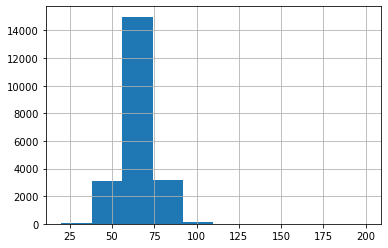

In [53]:
df_true['title'].str.len().hist(bins=10,range=[20,200])
plt.show()


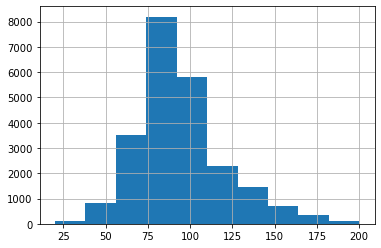

In [54]:
df_fake['title'].str.len().hist(bins=10,range=[20,200])
plt.show()

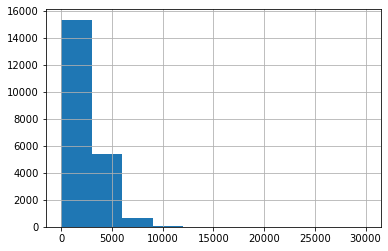

In [55]:
df_true['text'].str.len().hist(bins=10,range=[0,30000])
plt.show()

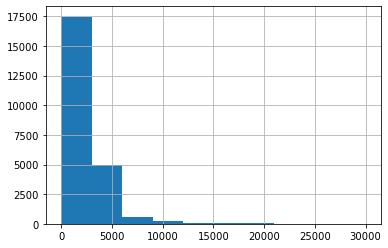

In [56]:
df_fake['text'].str.len().hist(bins=10,range=[0,30000])
plt.show()


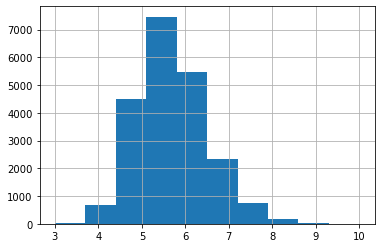

In [57]:
df_true['title'].str.split().\
   apply(lambda x : [len(i) for i in x]). \
   map(lambda x: np.mean(x)).hist(bins=10, range=[3.0, 10])
plt.show()

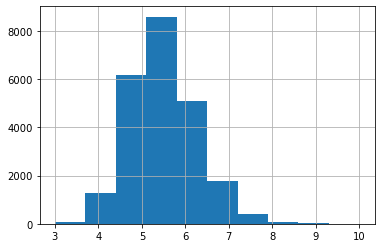

In [58]:
# Essayons de classer non en fonction de max min et non en faisons en sorte que les graphiques soient similaires 
# Pour la comparaison
df_fake['title'].str.split().\
   apply(lambda x : [len(i) for i in x]). \
   map(lambda x: np.mean(x)).hist(bins=10, range=[3.0, 10])
plt.show()

C:\Users\phamd\AppData\Roaming\Python\Python38\site-packages\numpy\core\fromnumeric.py:3372: RuntimeWarning:

Mean of empty slice.

C:\Users\phamd\AppData\Roaming\Python\Python38\site-packages\numpy\core\_methods.py:170: RuntimeWarning:

invalid value encountered in double_scalars



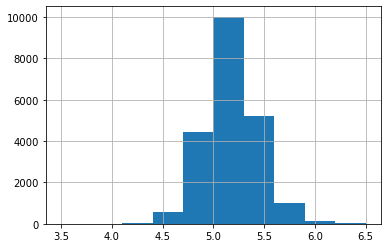

In [59]:
df_true['text'].str.split().\
   apply(lambda x : [len(i) for i in x]). \
   map(lambda x: np.mean(x)).hist(bins=10, range=[3.5, 6.5])
plt.show()

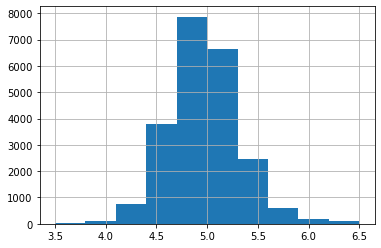

In [60]:
df_fake['text'].str.split().\
   apply(lambda x : [len(i) for i in x]). \
   map(lambda x: np.mean(x)).hist(bins=10, range=[3.5, 6.5])
plt.show()

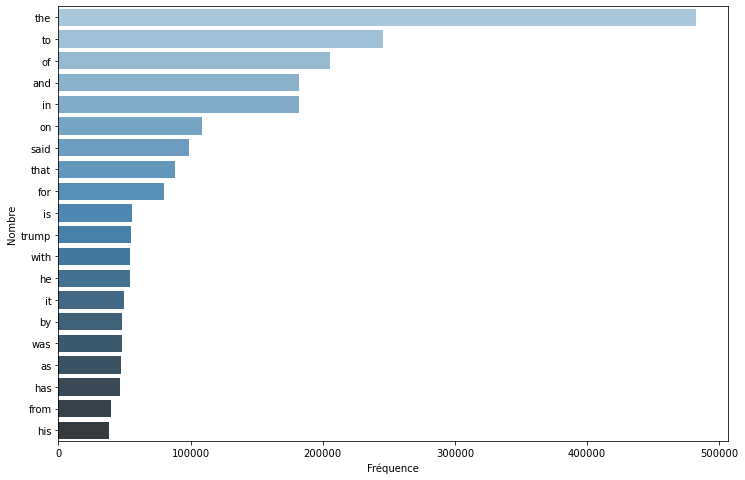

In [61]:
# Top 20 unigrams
word_vectorizer = CountVectorizer(ngram_range=(1,1), analyzer='word')
sparse_matrix = word_vectorizer.fit_transform(df_true['text'])
frequencies = sum(sparse_matrix).toarray()[0]
word = pd.DataFrame(frequencies, index=word_vectorizer.get_feature_names(), columns=['Fréquence'])
word = word.nlargest(columns = "Fréquence", n = 20)
plt.figure(figsize=(12,8))
ax = sns.barplot(data = word, y = word.index, x = "Fréquence", palette=("Blues_d"))
sns.set_context("poster")
ax.set(ylabel = "Nombre")
plt.show()

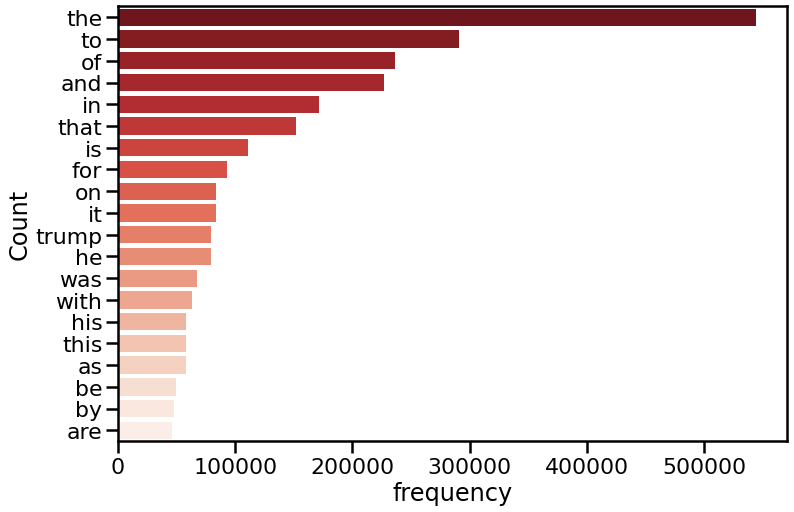

In [62]:
# Le top 20 des unigrams
word_vectorizer = CountVectorizer(ngram_range=(1,1), analyzer='word')
sparse_matrix = word_vectorizer.fit_transform(df_fake['text'])
frequencies = sum(sparse_matrix).toarray()[0]
word = pd.DataFrame(frequencies, index=word_vectorizer.get_feature_names(), columns=['frequency'])
word = word.nlargest(columns = "frequency", n = 20)
plt.figure(figsize=(12,8))
ax = sns.barplot(data = word, y = word.index, x = "frequency", palette=("Reds_r"))
sns.set_context("poster")
ax.set(ylabel = "Count")
plt.show()

In [63]:
len_true = len(true)
train_true = int(len_true*0.8)
len_fake = len(fake)
test_fake = int(len_true*0.8)

true_tag = pd.DataFrame({'category':['true']*21417})
true_post = true['text']

final_true = pd.concat([true_post,true_tag], axis = 1)
final_true

fake_tag = pd.DataFrame({'category':['fake']*20000})
fake_post = true['text'].iloc[0:20000]

final_fake = pd.concat([fake_post,fake_tag], axis = 1)
final_fake


final_data = pd.concat([final_true, final_fake]) 

final_data.sample(frac = 0.001)

,text,category
18341,MADRID (Reuters) - The influential Catalan bus...,true
2523,MOSCOW (Reuters) - Draft new U.S. sanctions ag...,fake
580,WASHINGTON (Reuters) - U.S. President Donald T...,fake
12730,DUBAI (Reuters) - A day before they killed Yem...,fake
2045,PHOENIX (Reuters) - U.S. President Donald Trum...,fake
8524,"GREEN BAY, Wis./WASHINGTON (Reuters) - Republi...",true
1254,MOSCOW (Reuters) - Russian Deputy Foreign Mini...,true
7008,(Reuters) - U.S. President-elect Donald Trump ...,fake
15713,MADRID/BRUSSELS (Reuters) - Spain on Friday is...,fake
19615,BEIJING (Reuters) - China believes that the Ve...,true


<AxesSubplot:xlabel='count', ylabel='subject'>

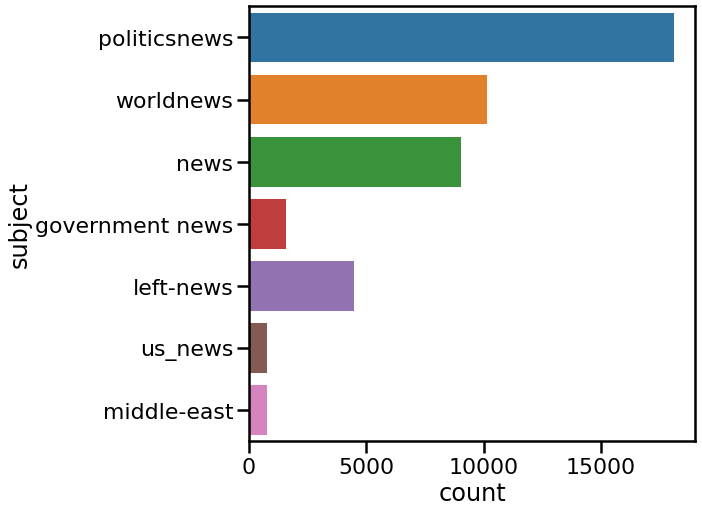

In [64]:
# Traçons le nombre d'échantillons par 'sujet'
plt.figure(figsize = (8, 8))
sns.countplot(y = "subject", data = df)

In [65]:
def clean_train_data(x):
    text = x
    text = text.lower()
    text = re.sub('\[.*?\]', '', text) 
    text = re.sub(r'[^\w\s]','',text) 
    text = re.sub('\w*\d\w*', '', text) 
    text = re.sub(r'http\S+', '', text)
    text = re.sub('\n', '', text)
    return text

In [122]:
import pandas as pd
import numpy as np

import spacy
from spacy.lang.en.stop_words import STOP_WORDS

In [123]:
df_fake = pd.read_csv('D:/Fake_news.csv')
df_true = pd.read_csv('D:/Real_news.csv')

In [124]:
df_true['Cible'] = 1
df_fake['Cible'] = 0
df = pd.concat([df_true, df_fake]).reset_index(drop = True)
df['original'] = df['title'] + ' ' + df['text']
df.head()

,title,text,subject,date,Cible,original
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1,"As U.S. budget fight looms, Republicans flip t..."
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1,U.S. military to accept transgender recruits o...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1,Senior U.S. Republican senator: 'Let Mr. Muell...
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1,FBI Russia probe helped by Australian diplomat...
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1,Trump wants Postal Service to charge 'much mor...


In [125]:
df['text'].value_counts()

In [126]:
df['word_counts'] = df['text'].apply(lambda x: len(str(x).split()))

In [127]:
df.head()

,title,text,subject,date,Cible,original,word_counts
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1,"As U.S. budget fight looms, Republicans flip t...",749
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1,U.S. military to accept transgender recruits o...,624
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1,Senior U.S. Republican senator: 'Let Mr. Muell...,457
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1,FBI Russia probe helped by Australian diplomat...,376
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1,Trump wants Postal Service to charge 'much mor...,852


In [128]:
df['char_counts'] = df['text'].apply(lambda x: len(x))
df.head()

,title,text,subject,date,Cible,original,word_counts,char_counts
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1,"As U.S. budget fight looms, Republicans flip t...",749,4659
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1,U.S. military to accept transgender recruits o...,624,4077
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1,Senior U.S. Republican senator: 'Let Mr. Muell...,457,2789
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1,FBI Russia probe helped by Australian diplomat...,376,2461
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1,Trump wants Postal Service to charge 'much mor...,852,5204


In [129]:
import spacy

In [130]:
x = 'Ceci est le code de suppression des mots vides'

In [131]:
" ".join([t for t in x.split() if t not in STOP_WORDS])

'Ceci est le code de suppression des mots vides'

In [132]:
df['text'] = df['text'].apply(lambda x: " ".join([t for t in x.split() if t not in STOP_WORDS]))

In [133]:
df.head()

,title,text,subject,date,Cible,original,word_counts,char_counts
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head conservative R...,politicsNews,"December 31, 2017",1,"As U.S. budget fight looms, Republicans flip t...",749,4659
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people allo...,politicsNews,"December 29, 2017",1,U.S. military to accept transgender recruits o...,624,4077
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1,Senior U.S. Republican senator: 'Let Mr. Muell...,457,2789
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1,FBI Russia probe helped by Australian diplomat...,376,2461
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1,Trump wants Postal Service to charge 'much mor...,852,5204


In [134]:
nlp = spacy.load('en_core_web_sm')

In [135]:
x = 'John dived times ball managed save 90 rest'

In [136]:
def make_to_base(x):
    x_list = []
    doc = nlp(x)
    
    for token in doc:
        lemma = str(token.lemma_)
        if lemma == '-PRON-' or lemma == 'be':
            lemma = token.text
        x_list.append(lemma)
    print(" ".join(x_list))

In [137]:
' '.join(df.head()['text'])

'WASHINGTON (Reuters) - The head conservative Republican faction U.S. Congress, voted month huge expansion national debt pay tax cuts, called “fiscal conservative” Sunday urged budget restraint 2018. In keeping sharp pivot way Republicans, U.S. Representative Mark Meadows, speaking CBS’ “Face Nation,” drew hard line federal spending, lawmakers bracing battle January. When return holidays Wednesday, lawmakers begin trying pass federal budget fight likely linked issues, immigration policy, November congressional election campaigns approach Republicans seek control Congress. President Donald Trump Republicans want big budget increase military spending, Democrats want proportional increases non-defense “discretionary” spending programs support education, scientific research, infrastructure, public health environmental protection. “The (Trump) administration willing say: ‘We’re going increase non-defense discretionary spending ... 7 percent,’” Meadows, chairman small influential House Freed

In [138]:
make_to_base(x)

John dive time ball manage save 90 rest


In [139]:
' '.join(df.head()['text'])

'WASHINGTON (Reuters) - The head conservative Republican faction U.S. Congress, voted month huge expansion national debt pay tax cuts, called “fiscal conservative” Sunday urged budget restraint 2018. In keeping sharp pivot way Republicans, U.S. Representative Mark Meadows, speaking CBS’ “Face Nation,” drew hard line federal spending, lawmakers bracing battle January. When return holidays Wednesday, lawmakers begin trying pass federal budget fight likely linked issues, immigration policy, November congressional election campaigns approach Republicans seek control Congress. President Donald Trump Republicans want big budget increase military spending, Democrats want proportional increases non-defense “discretionary” spending programs support education, scientific research, infrastructure, public health environmental protection. “The (Trump) administration willing say: ‘We’re going increase non-defense discretionary spending ... 7 percent,’” Meadows, chairman small influential House Freed

In [140]:
'switchfoot - awww bummer shoulda got david carr day d upset update facebook texting cry result school today blah kenichan dived times ball managed save 90 rest bounds body feels itchy like fire nationwideclass behaving mad'


'switchfoot - awww bummer shoulda got david carr day d upset update facebook texting cry result school today blah kenichan dived times ball managed save 90 rest bounds body feels itchy like fire nationwideclass behaving mad'

In [141]:
text = ' '.join(df['text'])

In [142]:
text = text.split()

In [143]:
freq_comm = pd.Series(text).value_counts()

In [144]:
f20 = freq_comm[:20]

In [145]:
f20

s             172259
Trump         101305
The            95236
said           93137
I              53495
U.S.           46126
t              41974
people         32968
President      32303
-              31122
Donald         27014
said.          26190
It             24012
He             23638
told           23171
Republican     22932
United         22752
Obama          21592
government     21437
House          21414
dtype: int64

In [146]:
df['text'] = df['text'].apply(lambda x: " ".join([t for t in x.split() if t not in f20]))

In [147]:
rare20 = freq_comm[-20:]

In [148]:
rare20

(2,316,417                                         1
0,d)})}};ja.prototype.g=function(a,b,c,d,e){var    1
“obsession                                         1
'Unhinged'                                         1
Oasis,                                             1
Fas,                                               1
[Playboy].                                         1
Now.Watch:Upon                                     1
headscratching                                     1
Belloc                                             1
Swimmer,                                           1
survive.We                                         1
places.When                                        1
#Eclipse                                           1
“account                                           1
reut.rs/2d9cl4q                                    1
scammy,                                            1
officer.Portland                                   1
historical.                                   

In [149]:
rare = freq_comm[freq_comm.values == 1]

In [150]:
rare

YOU!'               1
source.Here         1
#nevertrump         1
Kaho’ohalahala,     1
house.Migrants      1
                   ..
reut.rs/2d9cl4q     1
scammy,             1
officer.Portland    1
historical.         1
Interracial         1
Length: 180755, dtype: int64

In [151]:
df['text'] = df['text'].apply(lambda x: ' '.join([t for t in x.split() if t not in rare20]))

In [152]:
df.head()

,title,text,subject,date,Cible,original,word_counts,char_counts
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) head conservative faction...,politicsNews,"December 31, 2017",1,"As U.S. budget fight looms, Republicans flip t...",749,4659
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) Transgender allowed time ...,politicsNews,"December 29, 2017",1,U.S. military to accept transgender recruits o...,624,4077
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) special counsel investiga...,politicsNews,"December 31, 2017",1,Senior U.S. Republican senator: 'Let Mr. Muell...,457,2789
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) campaign adviser George P...,politicsNews,"December 30, 2017",1,FBI Russia probe helped by Australian diplomat...,376,2461
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) called Postal Ser...,politicsNews,"December 29, 2017",1,Trump wants Postal Service to charge 'much mor...,852,5204


## Visualisation en nuage de mots

### Dans cette section, nous visualiserons le corpus de texte à l'aide de la bibliothèque WordCloud.

In [153]:
!pip install wordcloud

In [154]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
%matplotlib inline

In [155]:
x = ' '.join(text[:20000])

In [156]:
len(text)

10697774

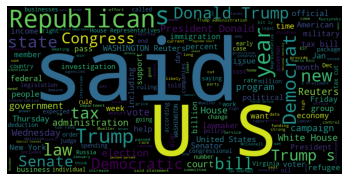

In [157]:
wc = WordCloud(width = 800, height=400).generate(x)
plt.imshow(wc)
plt.axis('off')
plt.show()

Wordcloud des Real News.


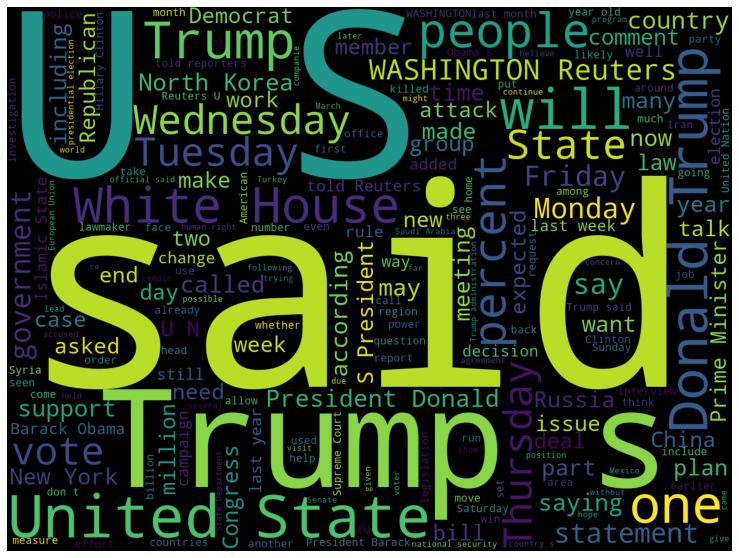

In [158]:
cloud = WordCloud(width=1440, height=1080).generate(" ".join(df_true["text"].astype(str)))
plt.figure(figsize=(15, 10))
plt.imshow(cloud)
plt.axis('off')

print("Wordcloud des Real News.")

Wordcloud des Fake News.


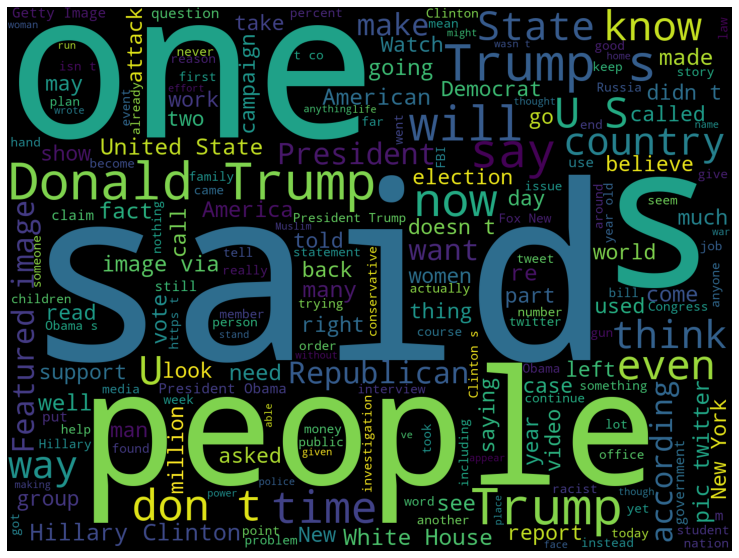

In [159]:
cloud = WordCloud(width=1440, height=1080).generate(" ".join(df_fake["text"].astype(str)))
plt.figure(figsize=(15, 10))
plt.imshow(cloud)
plt.axis('off')

print("Wordcloud des Fake News.")

### Les deux nuages de mots ci-dessus font quelques bons points sur l'ensemble de données:

La combinaison de mots Hillary Clinton apparaît plus fréquemment dans les Fake News que dans les Real News.

La combinaison de mots FBI apparaît également plus fréquemment dans les Fakes News que dans les Real News.

Le mot Reuters est apparu à plusieurs reprises dans les Real News.

La combinaison de mots contenant le mot twitter est apparue à plusieurs reprises dans l'ensemble de données des Fake News. Il est peut-être vrai qu'une bonne partie des Fake News ont été associés aux comptes Twitter des sujets dans les articles.

Nous pouvons également expérimenter l'index de lisibilité pour chaque article des Real et Fake News.

Pour l'indice de lisibilité, nous utilisons la formule de score de facilité de lecture de Flesch. Le score de facilité de lecture flesch détermine le niveau de difficulté d'un texte. Les valeurs du score de facilité de lecture de Flesch sont classées comme suit:

90-100: très facile
80-89: facile
70-79: assez facile
60-69: Standard
50-59: assez difficile
30-49: difficile
0-29: très déroutant


### La formule de calcul du score de facilité de lecture flesch est donnée ci-dessous:

RE = 206,835 - (1,015 x ASL) - (84,6 x ASW)

RE = Facilité de lisibilité

ASL = Longueur moyenne des phrases (c'est-à-dire le nombre de mots divisé par le nombre de phrases)

ASW = Nombre moyen de syllabes par mot (c'est-à-dire le nombre de syllabes divisé par le nombre de mots)


In [160]:
import textstat as ts
true_news_readability = []
fake_news_readability = []

for sentence in df_true["text"].tolist():
    temp = ts.flesch_reading_ease(sentence)
    true_news_readability.append(temp)
    
for sentence in df_fake["text"].tolist():
    temp = ts.flesch_reading_ease(sentence)
    fake_news_readability.append(temp)

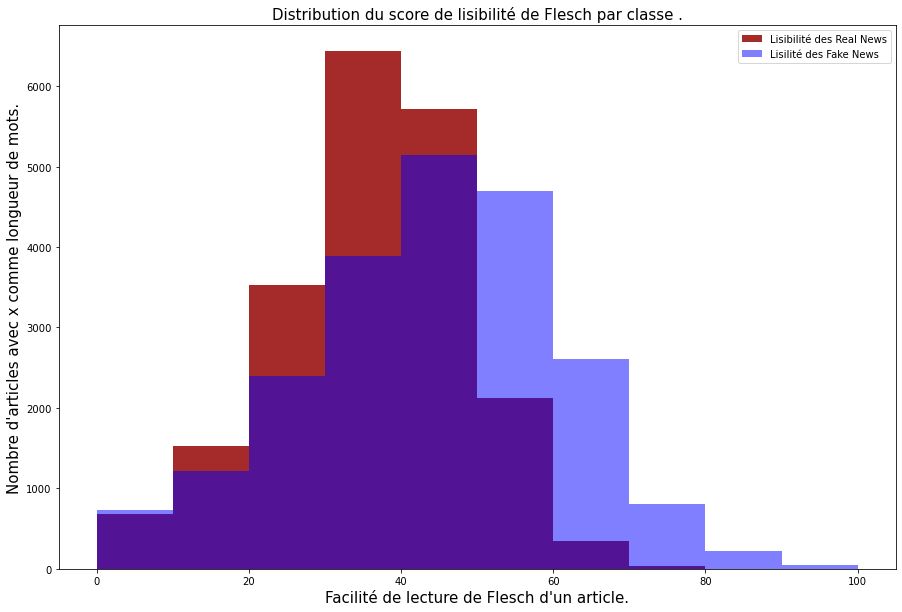

In [161]:
true_readability_df = pd.Series(true_news_readability)
fake_readability_df = pd.Series(fake_news_readability)

plt.figure(figsize = (15,10))
plt.hist(true_readability_df, bins = 10, range = [0, 100], color = "brown", label = "Lisibilité des Real News")
plt.hist(fake_readability_df, bins = 10, range = [0, 100], color = "blue", alpha = 0.5, label = "Lisilité des Fake News")
plt.xlabel("Facilité de lecture de Flesch d'un article.", fontsize = 15)
plt.ylabel("Nombre d'articles avec x comme longueur de mots.", fontsize = 15)
plt.title("Distribution du score de lisibilité de Flesch par classe .", fontsize = 15)
plt.legend()
plt.show()

La figure ci-dessus montre la distribution de fréquence du score de lisibilité de Flesch pour les Real News et Fake News. On peut remarquer que:

La lisibilité parfaite des Real News est bien moindre que celle des Fake News.

La lisibilité maximale des Real News va jusqu'à 80 tandis que la lisibilité maximale des Fake News va jusqu'à 100.

De plus, nous pouvons vérifier les dates auxquelles le nombre maximum de Fakes News a été publié.

In [162]:
fake_datewise_counts = df_fake.groupby('date').date.agg([('count', 'count')]).reset_index().sort_values(by = "count", ascending = False)

fake_datewise_counts = fake_datewise_counts.head(50)

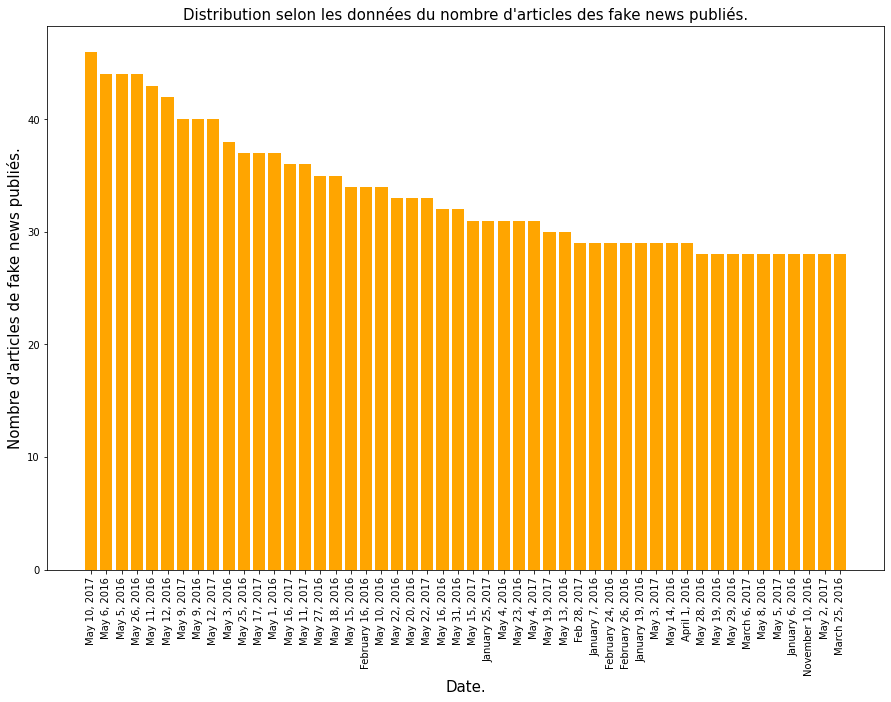

In [163]:
plt.figure(figsize = (15,10))
plt.xticks(rotation = 90)
plt.bar(fake_datewise_counts["date"], fake_datewise_counts["count"], align = "center", color = "orange")
plt.xlabel("Date.", fontsize = 15)
plt.ylabel("Nombre d'articles de fake news publiés.", fontsize = 15)
plt.title("Distribution selon les données du nombre d'articles des fake news publiés.", fontsize = 15)
plt.show()

Le diagramme à barres de distribution des fréquences ci-dessus montre que le plus grand nombre des articles de Fake News est publié le 10 mai 2017 avec plus de 40 articles de Fake News.

Voici quelques-uns des articles de Fake News publiés le 10 mai 2017:

In [164]:
df_fake.loc[df_fake["date"] == "May 10, 2017"]["title"].tolist()[:10]


[' Comey Sources Are Speaking Out; He Was Fired For Two Reasons And They Are Both Frightening (VIDEO)',
 ' Top Dems Take Action To Keep Documents On Russia Investigation Safe From Trump',
 ' Betsy DeVos TOTALLY HUMILIATED During Keynote Speech At Historically Black University',
 ' White Las Vegas Teen Caught On Camera Calling Black Student ‘F*cking N*****’ (VIDEO)',
 ' Trump Meets With Russian Officials One Day After Firing Comey, Bars American Media From The Room',
 ' BOMBSHELL: FBI Admits They Are Directly Investigating Donald Trump',
 ' Trump Explains Why He Fired James Comey, F*cks Up And Admits He Should Be Impeached (VIDEO)',
 ' WATCH: Kellyanne Conway Wore Out Her Welcome On CNN As Soon As She Opened Her Mouth',
 ' Kellyanne Conway Threatens Media: It’s ‘Inappropriate’ To Question Comey’s Firing (VIDEO)',
 ' Advisers Leak What Trump Does When He Sees Russia Scandal On TV — It’s Really, Really Weird']

In [165]:
df = pd.concat([df_true, df_fake], ignore_index=True, sort=False)
df.head()

,title,text,subject,date,Cible
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1


Text(0.5, 1.0, 'Distribution des données des Fake et Real News')

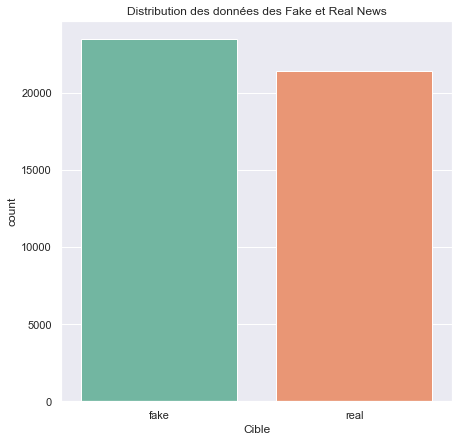

In [166]:
plt.figure(figsize=(7, 7))
sns.set(style="darkgrid")

color = sns.color_palette("Set2")
ax = sns.countplot(x="Cible", data=df, palette=color)

ax.set(xticklabels=['fake', 'real'])

plt.title("Distribution des données des Fake et Real News")

Text(0.5, 1.0, 'Distribution des données des Fake and Real News')

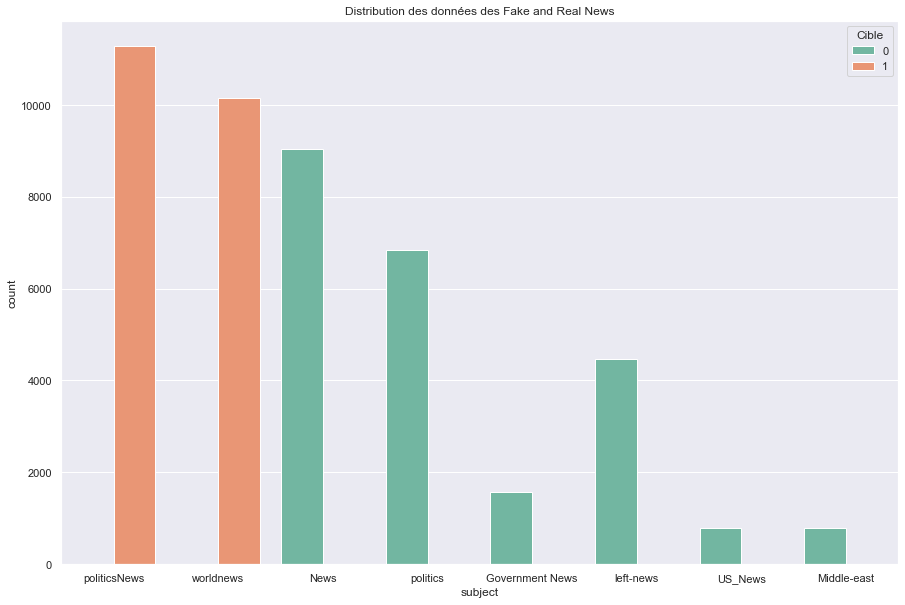

In [167]:
plt.figure(figsize=(15, 10))
sns.set(style="darkgrid")

color = sns.color_palette("Set2")
ax = sns.countplot(x="subject",  hue='Cible', data=df, palette=color)

# ax.set(xticklabels=['fake', 'real'])

plt.title("Distribution des données des Fake and Real News")

## Distribution par sujet

In [168]:
ex_df = df.copy()
ex_df = ex_df.replace(["politicsNews"], 'politics')
ex_df.head()

,title,text,subject,date,Cible
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politics,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politics,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politics,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politics,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politics,"December 29, 2017",1


Text(0.5, 1.0, 'Distribution des donées des Fake et Real News')

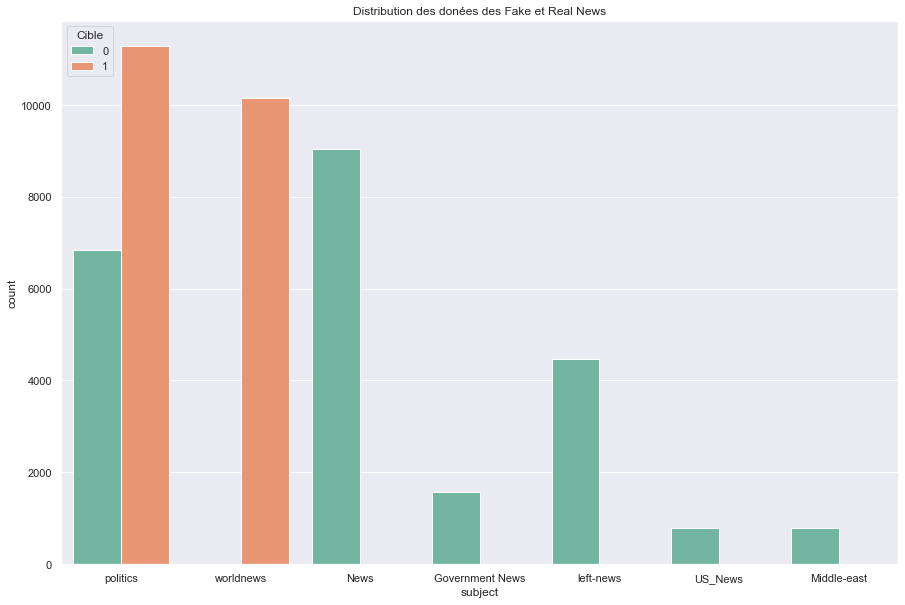

In [169]:
plt.figure(figsize=(15, 10))
sns.set(style="darkgrid")

color = sns.color_palette("Set2")
ax = sns.countplot(x="subject",  hue='Cible', data=ex_df, palette=color)

# ax.set(xticklabels=['fake', 'real'])

plt.title("Distribution des donées des Fake et Real News")

## Longueur du texte

C:\Users\phamd\AppData\Roaming\Python\Python38\site-packages\numpy\core\fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\phamd\AppData\Roaming\Python\Python38\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
C:\Users\phamd\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\phamd\AppData\Roaming\Python\Python38\site-packages\numpy\core\fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\Users\phamd\AppData\Roaming\Python\Python38\site-packages\numpy\core\_methods.py:170: RuntimeW

Text(0.5, 0.98, 'Longueur moyenne des mots dans chaque texte')

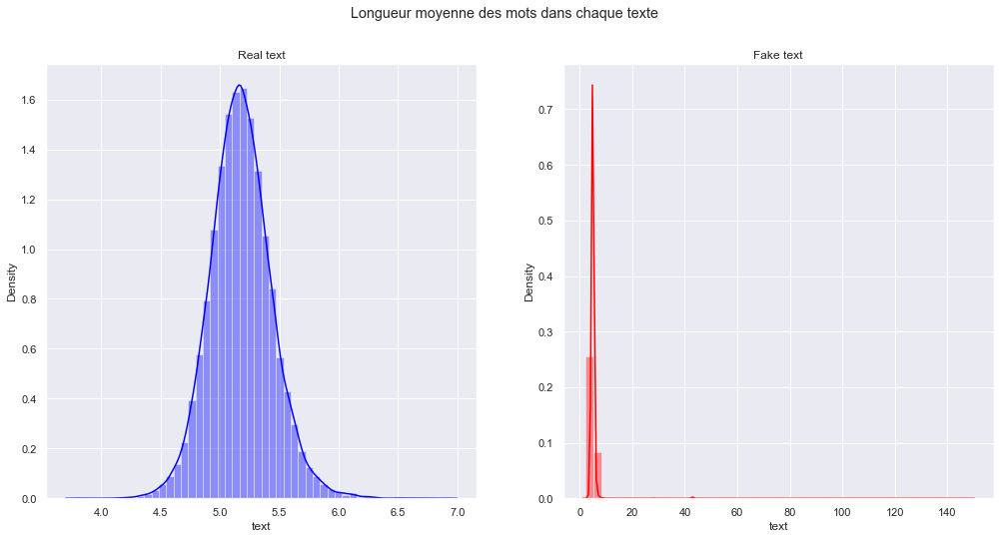

In [170]:
fig,(ax1,ax2)=plt.subplots(1,2,figsize=(17,8))

word = ex_df[ex_df['Cible']==1]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='blue')
ax1.set_title('Real text')

word = ex_df[ex_df['Cible']==0]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='red')
ax2.set_title('Fake text')

fig.suptitle('Longueur moyenne des mots dans chaque texte')

La longueur moyenne du texte n'est pas la même pour les deux. Et la différence est vraiment remarquable. Oui, la longueur ne peut pas être la même mais cette différence est énorme. Peut-être que cela peut entraver un modèle de formation.

D'abord, nous avons vu que la longueur moyenne du texte des Fake News n'est pas très longue, mais dans des mots uniques, elle apparaît plus élevée que les données réelles. C'est moyen, le ratio des mêmes mots est trop élevé.

In [171]:
def avg_text_length(dataframe):
    rowCounts = [len(x.split()) for x in dataframe["text"].tolist()]
    avgCount = sum(rowCounts)//len(rowCounts)
    
    return avgCount

In [172]:
print("Avg. text length for true news: {}".format(avg_text_length(df_true)))
print("Avg. text length for fake news: {}".format(avg_text_length(df_fake)))

Avg. text length for true news: 385
Avg. text length for fake news: 423


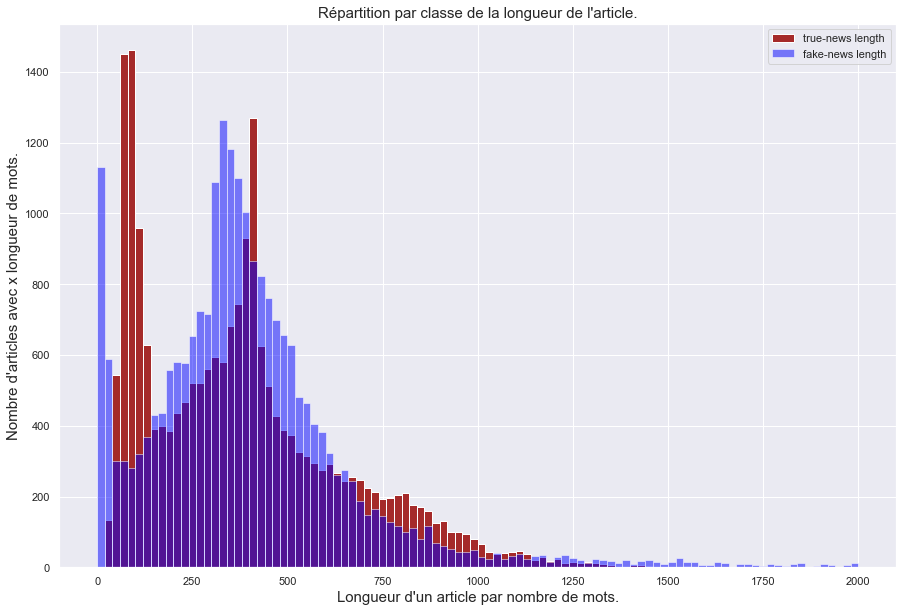

In [173]:
# Traçons l'histogramme pour des informations significatives.

true_lengths = pd.Series([len(x.split()) for x in df_true["text"].tolist()])
fake_lengths = pd.Series([len(x.split()) for x in df_fake["text"].tolist()])

plt.figure(figsize = (15,10))
plt.hist(true_lengths, bins = 100, range = [0, 2000], color = "brown", label = "true-news length")
plt.hist(fake_lengths, bins = 100, range = [0, 2000], color = "blue", alpha = 0.5, label = "fake-news length")
plt.xlabel("Longueur d'un article par nombre de mots.", fontsize = 15)
plt.ylabel("Nombre d'articles avec x longueur de mots.", fontsize = 15)
plt.title("Répartition par classe de la longueur de l'article.", fontsize = 15)
plt.legend()
plt.show()

L'histogramme ci-dessus regroupe les articles d'actualité avec la même longueur de mots et trace la distribution de fréquence pour chaque longueur de mots. Les barres en marron montrent la distribution de fréquence de la longueur des mots des articles des Real News tandis que les barres en bleu clair montrent la même chose pour les articles des Fake News. Notons que la partie des barres en bleu plus foncé (plus comme le violet) représente les zones communes aux articles des Real News et Fake News.

Certaines des informations de cet histogramme:

Un article de Real News contient plus de 1400 mots. iL y a comparativement beaucoup plus d'articles de Fake News avec une longueur de plus de 1400 mots.

Le mode de longueur de mot des Real News se situe entre 200 et 250 mots.

Il y a plus de 1100 Fake News avec une longueur de texte égale à 0.

Remarque: la plage de l'histogramme est définie sur 2000 car il y a extrêmement moins d'articles d'actualité avec une longueur de mot supérieure à 2000.

Ensuite, nous avons calculé le résumé en cinq chiffres de la longueur des mots des Real News et des Fake News. Le résumé à cinq chiffres montre le minimum, le maximum, le quartile supérieur, le quartile inférieur et la médiane d'une distribution de données. 

Nous remarquons que la valeur minimale pour les Real News et Fake News est égale à 0 tandis que la valeur maximale pour les Fake News est beaucoup plus élevée que celle des Real News. La longueur médiane des mots pour les Fake News et les Real News est proche l'une de l'autre.

Toutes les analyses ci-dessus peuvent montrer que l'article moyen de Fake News sera un peu plus long que l'article moyen de Real News.

Une autre mesure clé que nous pouvons calculer est la fréquence des stopwords dans les Real News et les Fake News. Les stopwords étant les mots les plus courants dans les données d'une langue. 

In [174]:
stopwords = nltk.corpus.stopwords.words("english")

"""
Une fonction utilitaire pour calculer le % moyen des stopwords dans les Real News and Fake News.
.

"""

def stopwords_frequency(dataframe):
    words_list = [x.split() for x in dataframe["text"].tolist()]
    frequencies = []
    for row in words_list:
        if(len(row)) > 0:
            row_frequency = len([w for w in row if w in stopwords])
            row_frequency = (row_frequency/len(row))*100

            frequencies.append(row_frequency)
    
    avg = sum(frequencies)/len(frequencies)
    
    return avg

In [175]:
true_frequencies = stopwords_frequency(df_true)
fake_frequencies = stopwords_frequency(df_fake)

print("Moyenne de fréquence des stopwords dans les Real News: {}".format(true_frequencies))
print("Moyenne de fréquence des stopwords dans les Fake News: {}".format(fake_frequencies))

Moyenne de fréquence des stopwords dans les Real News: 36.12374342655998
Moyenne de fréquence des stopwords dans les Fake News: 39.509912127071104


Nous remarquons que les Real News et les Fake news ont un niveau de fréquence de stopwords similaire (36% et 39,5% respectivement). Cela signifie que la fréquence des stopwords n'est pas un bon moyen de distinguer les deux catégories.

Afin de vérifier les mots les plus fréquents dans les deux ensembles de données, nous traçons le nuage de mots du contenu textuel des Real News and Fake News.

## Prétraitement et nettoyage des données

In [176]:
import re

In [177]:
def clean_train_data(x):
    text = x
    text = text.lower()
    text = re.sub('\[.*?\]', '', text) 
    text = re.sub(r'[^\w\s]','',text) 
    text = re.sub('\w*\d\w*', '', text) 
    text = re.sub(r'http\S+', '', text)
    text = re.sub('\n', '', text)
    return text

In [178]:
clean_df = df.copy()
clean_df['text'] = df.text.apply(lambda x : clean_train_data(x))
clean_df.head()

,title,text,subject,date,Cible
0,"As U.S. budget fight looms, Republicans flip t...",washington reuters the head of a conservative...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,washington reuters transgender people will be...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,washington reuters the special counsel invest...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,washington reuters trump campaign adviser geo...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,seattlewashington reuters president donald tr...,politicsNews,"December 29, 2017",1


In [179]:
clean_df.tail()

,title,text,subject,date,Cible
44893,McPain: John McCain Furious That Iran Treated ...,century wire says as reported earlier this w...,Middle-east,"January 16, 2016",0
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,century wire says it s a familiar theme whene...,Middle-east,"January 16, 2016",0
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,patrick henningsen century wireremember when...,Middle-east,"January 15, 2016",0
44896,How to Blow $700 Million: Al Jazeera America F...,century wire says al jazeera america will go ...,Middle-east,"January 14, 2016",0
44897,10 U.S. Navy Sailors Held by Iranian Military ...,century wire says as predicted in its new ye...,Middle-east,"January 12, 2016",0


In [180]:
df['Cible'].value_counts()

0    23481
1    21417
Name: Cible, dtype: int64

## Nombre de mots

### Dans cette étape, nous divisons les phrases en mots en utilisant la fonction split () qui convertit la phrase en liste et en plus de cela, nous utilisons la fonction len () pour calculer le nombre de token ou de mots.

In [181]:
df['word_counts'] = df['text'].apply(lambda x: len(str(x).split()))
df.head()

,title,text,subject,date,Cible,word_counts
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1,749
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1,624
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1,457
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1,376
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1,852


# Nombre de caractères

### Dans cette étape, nous utilisons la fonction len () pour calculer le nombre de caractères à l'intérieur de chaque phrase.

In [182]:
df['char_counts'] = df['text'].apply(lambda x: len(x))
df.head()

,title,text,subject,date,Cible,word_counts,char_counts
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1,749,4659
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1,624,4077
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1,457,2789
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1,376,2461
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1,852,5204


## Calcul des StopWords

### Dans cette section, nous calculons le nombre de stopwords pour chaque phrase.

In [183]:
print(STOP_WORDS)

{'here', 'onto', 'six', 'ca', 'otherwise', 'may', 'us', 'cannot', 'hence', 'sometime', 'me', 'done', "'s", '‘d', 'also', 'top', 'had', 'neither', 'somewhere', 'amount', 'such', 'thereby', 'few', "'m", 'off', 'fifteen', 'say', 'just', 'go', 'within', "'re", 'anyone', 'never', 'hereby', 'rather', 'each', 'sixty', 'someone', 'hereupon', 'hundred', 'eleven', 'so', 'out', 'four', 'one', 'there', 'anywhere', 'beside', 'thru', 'another', 'hereafter', 'seem', 'would', 'throughout', 'until', 'under', 'yourself', 'up', 'herein', 'n’t', 'seems', 'did', 'among', 'wherever', 'nine', 'thus', 'doing', 'many', 'too', 'were', 'nevertheless', 'several', 'third', 'least', 'much', 'anyhow', 'should', 'none', 'whom', 'have', 'who', 'fifty', 'you', 'make', 'might', 'these', "n't", 'due', 'she', 'if', 'below', 'himself', 'whereas', 'over', 'during', 'see', 'themselves', 'give', 'behind', 'can', 'then', 'everywhere', 'nor', 'same', 'since', 'first', 'hers', 'could', 'itself', 'will', 'an', 'seemed', 'part', '

In [184]:
df['stop_words_len'] = df['text'].apply(lambda x: len([t for t in x.split() if t in STOP_WORDS]))
df.head()

,title,text,subject,date,Cible,word_counts,char_counts,stop_words_len
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1,749,4659,293
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1,624,4077,238
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1,457,2789,195
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1,376,2461,148
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1,852,5204,343


## Calcul et suppression des emails

### Dans cette section, nous supprimons et comptons les e-mails.

In [185]:
import re

In [186]:
x = 'hi my email me at email@email.com another@email.com'
re.findall(r'([a-zA-Z0-9+._-]+@[a-zA-Z0-9._-]+\.[a-zA-Z0-9_-]+)', x)

['email@email.com', 'another@email.com']

In [187]:
df['emails'] = df['text'].apply(lambda x: re.findall(r'([a-zA-Z0-9+._-]+@[a-zA-Z0-9._-]+\.[a-zA-Z0-9_-]+)', x))


In [188]:
df['emails_count'] = df['emails'].apply(lambda x: len(x))


In [189]:
df[df['emails_count']>0].head()


,title,text,subject,date,Cible,word_counts,char_counts,stop_words_len,emails,emails_count
4965,Tillerson's email alias was prompted by busine...,HOUSTON (Reuters) - U.S. Secretary of State Re...,politicsNews,"March 14, 2017",1,385,2445,149,"[Rex.W.Tillerson@ExxonMobil.com, Wayne.Tracker...",2
4975,Tillerson used email alias at Exxon to talk cl...,NEW YORK (Reuters) - U.S. Secretary of State R...,politicsNews,"March 14, 2017",1,352,2248,133,[Wayne.Tracker@exxonmobil.com],1
18687,Spanish court orders Google to delete app used...,MADRID (Reuters) - Catalonia s High Court on F...,worldnews,"September 29, 2017",1,119,754,41,[Onvotar1oct@gmail.com],1
28970,CHAOS In Chicago As Thousands Of Protesters S...,A scheduled rally for 2016 republican presiden...,News,"March 11, 2016",0,412,2750,149,[postponement.@DNAinfoCHIpic.twitter.com],1
30865,LET THE BOYCOTTS BEGIN: KEURIG COFFEE and 4 Ma...,"Before Keurig, and other major companies commi...",politics,"Nov 12, 2017",0,616,3928,239,[social@eloquii.com],1


In [190]:
re.sub(r'([a-zA-Z0-9+._-]+@[a-zA-Z0-9._-]+\.[a-zA-Z0-9_-]+)', '', x)

'hi my email me at  '

In [191]:
df['text'] = df['text'].apply(lambda x: re.sub(r'([a-zA-Z0-9+._-]+@[a-zA-Z0-9._-]+\.[a-zA-Z0-9_-]+)', '', x))


In [192]:
df[df['emails_count']>0].head()

,title,text,subject,date,Cible,word_counts,char_counts,stop_words_len,emails,emails_count
4965,Tillerson's email alias was prompted by busine...,HOUSTON (Reuters) - U.S. Secretary of State Re...,politicsNews,"March 14, 2017",1,385,2445,149,"[Rex.W.Tillerson@ExxonMobil.com, Wayne.Tracker...",2
4975,Tillerson used email alias at Exxon to talk cl...,NEW YORK (Reuters) - U.S. Secretary of State R...,politicsNews,"March 14, 2017",1,352,2248,133,[Wayne.Tracker@exxonmobil.com],1
18687,Spanish court orders Google to delete app used...,MADRID (Reuters) - Catalonia s High Court on F...,worldnews,"September 29, 2017",1,119,754,41,[Onvotar1oct@gmail.com],1
28970,CHAOS In Chicago As Thousands Of Protesters S...,A scheduled rally for 2016 republican presiden...,News,"March 11, 2016",0,412,2750,149,[postponement.@DNAinfoCHIpic.twitter.com],1
30865,LET THE BOYCOTTS BEGIN: KEURIG COFFEE and 4 Ma...,"Before Keurig, and other major companies commi...",politics,"Nov 12, 2017",0,616,3928,239,[social@eloquii.com],1


 ## Compter et supprimer les URL

### Dans cette section, nous supprimons et comptons les URL à l'aide des fonctions regex.

In [193]:
x = 'hi, to watch more visit https://youtube.com/kgptalkie'
re.findall(r'(http|ftp|https)://([\w_-]+(?:(?:\.[\w_-]+)+))([\w.,@?^=%&:/~+#-]*[\w@?^=%&/~+#-])?', x)

[('https', 'youtube.com', '/kgptalkie')]

In [194]:
df['urls_flag'] = df['text'].apply(lambda x: len(re.findall(r'(http|ftp|https)://([\w_-]+(?:(?:\.[\w_-]+)+))([\w.,@?^=%&:/~+#-]*[\w@?^=%&/~+#-])?', x)))


In [195]:
re.sub(r'(http|ftp|https)://([\w_-]+(?:(?:\.[\w_-]+)+))([\w.,@?^=%&:/~+#-]*[\w@?^=%&/~+#-])?', '', x)


'hi, to watch more visit '

In [196]:
df['text'] = df['text'].apply(lambda x: re.sub(r'(http|ftp|https)://([\w_-]+(?:(?:\.[\w_-]+)+))([\w.,@?^=%&:/~+#-]*[\w@?^=%&/~+#-])?', '', x))
df.head()

,title,text,subject,date,Cible,word_counts,char_counts,stop_words_len,emails,emails_count,urls_flag
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1,749,4659,293,[],0,0
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1,624,4077,238,[],0,0
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1,457,2789,195,[],0,0
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1,376,2461,148,[],0,0
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1,852,5204,343,[],0,0


In [197]:
df.loc[0]['text']

'WASHINGTON (Reuters) - The head of a conservative Republican faction in the U.S. Congress, who voted this month for a huge expansion of the national debt to pay for tax cuts, called himself a “fiscal conservative” on Sunday and urged budget restraint in 2018. In keeping with a sharp pivot under way among Republicans, U.S. Representative Mark Meadows, speaking on CBS’ “Face the Nation,” drew a hard line on federal spending, which lawmakers are bracing to do battle over in January. When they return from the holidays on Wednesday, lawmakers will begin trying to pass a federal budget in a fight likely to be linked to other issues, such as immigration policy, even as the November congressional election campaigns approach in which Republicans will seek to keep control of Congress. President Donald Trump and his Republicans want a big budget increase in military spending, while Democrats also want proportional increases for non-defense “discretionary” spending on programs that support educat

## Suppression des Retweets.

### Dans cette section, nous supprimons les caractères des Retweets.

In [198]:
df['text'] = df['text'].apply(lambda x: re.sub('RT', "", x))
df.head()

,title,text,subject,date,Cible,word_counts,char_counts,stop_words_len,emails,emails_count,urls_flag
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1,749,4659,293,[],0,0
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1,624,4077,238,[],0,0
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1,457,2789,195,[],0,0
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1,376,2461,148,[],0,0
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1,852,5204,343,[],0,0


## Suppression des caractères spéciaux ou de la ponctuation

### Dans cette section, nous supprimons les caractères spéciaux et les ponctuations

In [199]:
df['text'] = df['text'].apply(lambda x: re.sub('[^A-Z a-z 0-9-]+', '', x))
df.head()

,title,text,subject,date,Cible,word_counts,char_counts,stop_words_len,emails,emails_count,urls_flag
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON Reuters - The head of a conservativ...,politicsNews,"December 31, 2017",1,749,4659,293,[],0,0
1,U.S. military to accept transgender recruits o...,WASHINGTON Reuters - Transgender people will b...,politicsNews,"December 29, 2017",1,624,4077,238,[],0,0
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON Reuters - The special counsel inves...,politicsNews,"December 31, 2017",1,457,2789,195,[],0,0
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON Reuters - Trump campaign adviser Ge...,politicsNews,"December 30, 2017",1,376,2461,148,[],0,0
4,Trump wants Postal Service to charge 'much mor...,SEATTLEWASHINGTON Reuters - President Donald T...,politicsNews,"December 29, 2017",1,852,5204,343,[],0,0


## Suppression des espaces multiples

### Dans cette section, nous supprimons les espaces multiples.

In [200]:
x = 'thanks    for    watching and    please    like this video'
" ".join(x.split())

'thanks for watching and please like this video'

In [201]:
df['text'] = df['text'].apply(lambda x: " ".join(x.split()))
df.head(2)

,title,text,subject,date,Cible,word_counts,char_counts,stop_words_len,emails,emails_count,urls_flag
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON Reuters - The head of a conservativ...,politicsNews,"December 31, 2017",1,749,4659,293,[],0,0
1,U.S. military to accept transgender recruits o...,WASHINGTON Reuters - Transgender people will b...,politicsNews,"December 29, 2017",1,624,4077,238,[],0,0


## Suppression des balises HTML

### Dans cette section, nous supprimons les balises HTML

In [202]:
from bs4 import BeautifulSoup

In [203]:
x = '<html><h2>Thanks for watching</h2></html>'
BeautifulSoup(x, 'lxml').get_text()

'Thanks for watching'

In [204]:
%%time
df['text'] = df['text'].apply(lambda x: BeautifulSoup(x, 'lxml').get_text())

Wall time: 8.44 s


## Suppression des caractères accentués

### Dans cette section, nous supprimons les caractères accentués

In [205]:
import unicodedata

In [206]:
x = 'Áccěntěd těxt'
def remove_accented_chars(x):
    x = unicodedata.normalize('NFKD', x).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    return x

In [207]:
remove_accented_chars(x)

'Accented text'

## Suppression des Stopwords

### Dans cette section, nous supprimons des stopwords du texte.

In [208]:
import spacy

In [209]:
x = 'this is stop words removal code is a the an how what'
" ".join([t for t in x.split() if t not in STOP_WORDS])

'stop words removal code'

In [210]:
df['text'] = df['text'].apply(lambda x: " ".join([t for t in x.split() if t not in STOP_WORDS]))
df.head(2)

,title,text,subject,date,Cible,word_counts,char_counts,stop_words_len,emails,emails_count,urls_flag
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON Reuters - The head conservative Rep...,politicsNews,"December 31, 2017",1,749,4659,293,[],0,0
1,U.S. military to accept transgender recruits o...,WASHINGTON Reuters - Transgender people allowe...,politicsNews,"December 29, 2017",1,624,4077,238,[],0,0


In [211]:
eng_stopwords = nltk.corpus.stopwords.words("english")

In [212]:
def remove_eng_stopwords(text):
    token_text = nltk.word_tokenize(text)
    remove_stop = [word for word in token_text if word not in eng_stopwords]
    join_text = ' '.join(remove_stop)
    return join_text

In [213]:
stopword_df = clean_df.copy()
stopword_df['text'] = clean_df.text.apply(lambda x : remove_eng_stopwords(x))
stopword_df.head()

,title,text,subject,date,Cible
0,"As U.S. budget fight looms, Republicans flip t...",washington reuters head conservative republica...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,washington reuters transgender people allowed ...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,washington reuters special counsel investigati...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,washington reuters trump campaign adviser geor...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,seattlewashington reuters president donald tru...,politicsNews,"December 29, 2017",1


## Conversion en forme de base ou racine de mot

### Dans cette section, nous convertissons les mots en leurs formes.

In [214]:
nlp = spacy.load('en_core_web_sm')

In [215]:
x = 'Paul dived times ball managed save 80 rest'

In [216]:
def make_to_base(x):
    x_list = []
    doc = nlp(x)
    
    for token in doc:
        lemma = str(token.lemma_)
        if lemma == '-PRON-' or lemma == 'be':
            lemma = token.text
        x_list.append(lemma)
    print(" ".join(x_list))

In [217]:
make_to_base(x)

Paul dive time ball manage save 80 rest


## Suppression des mots courants

### Dans cette section, nous supprimons les 20 mots les plus fréquents du corpus de texte.

In [206]:
' '.join(df.head()['text'])

'WASHINGTON Reuters - The head conservative Republican faction US Congress voted month huge expansion national debt pay tax cuts called fiscal conservative Sunday urged budget restraint 2018 In keeping sharp pivot way Republicans US Representative Mark Meadows speaking CBS Face Nation drew hard line federal spending lawmakers bracing battle January When return holidays Wednesday lawmakers begin trying pass federal budget fight likely linked issues immigration policy November congressional election campaigns approach Republicans seek control Congress President Donald Trump Republicans want big budget increase military spending Democrats want proportional increases non-defense discretionary spending programs support education scientific research infrastructure public health environmental protection The Trump administration willing Were going increase non-defense discretionary spending 7 percent Meadows chairman small influential House Freedom Caucus said program Now Democrats saying that

In [207]:
text = ' '.join(df['text'])

In [208]:
text = text.split()

In [209]:
freq_comm = pd.Series(text).value_counts()

In [210]:
f20 = freq_comm[:20]
f20

s             173305
said          129860
Trump         115162
The            99113
I              57933
US             53602
t              42809
people         38998
President      33634
-              31139
Reuters        28613
Donald         27488
Clinton        25709
government     25332
It             25318
House          24758
Obama          24676
He             24452
Republican     24159
told           23305
dtype: int64

In [211]:
df['text'] = df['text'].apply(lambda x: " ".join([t for t in x.split() if t not in f20]))

## Suppression des mots rares

### Dans cette section, nous supprimons les 20 petits mots les plus fréquents du corpus de texte

In [212]:
rare20 = freq_comm[-20:]
rare20

militantsSure              1
understatementNow          1
PiS-ally                   1
HUCKABEE-SANDERS           1
migrationare               1
JWilsonreporter            1
DangerGirl                 1
Bandelier                  1
TreehouseAdditionally      1
Manjoo                     1
CanadaGovernment           1
weTrump                    1
quotesHillary              1
pictwittercompyUE2UxbWW    1
TaylorMaycan               1
OrlandoPulse               1
tous                       1
incarnated                 1
ForbesYes                  1
investigationTo            1
dtype: int64

In [213]:
rare = freq_comm[freq_comm.values == 1]
rare

needOn             1
Amanatidis         1
rebukeMy           1
Metsola            1
Slav               1
                  ..
OrlandoPulse       1
tous               1
incarnated         1
ForbesYes          1
investigationTo    1
Length: 112368, dtype: int64

In [214]:
df['text'] = df['text'].apply(lambda x: ' '.join([t for t in x.split() if t not in rare20]))
df.head(2)

,title,text,subject,date,Cible,word_counts,char_counts,stop_words_len,emails,emails_count,urls_flag
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON head conservative faction Congress ...,politicsNews,"December 31, 2017",1,749,4659,293,[],0,0
1,U.S. military to accept transgender recruits o...,WASHINGTON Transgender allowed time enlist mil...,politicsNews,"December 29, 2017",1,624,4077,238,[],0,0


## Récupération des mots courants

In [215]:
from itertools import chain
from collections import Counter

In [216]:
list_words = stopword_df['text'].str.split()
list_words_merge = list(chain(*list_words))

d = Counter(list_words_merge)
df = pd.DataFrame(data=d, index=['count'])
top_common_words = df.T.sort_values(by=['count'], ascending=False).reset_index().head(50)
top_common_words.head()

,index,count
0,said,130051
1,trump,115869
2,us,63100
3,would,54929
4,president,51005


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),
 [Text(0, 0, 'said'),
  Text(1, 0, 'trump'),
  Text(2, 0, 'us'),
  Text(3, 0, 'would'),
  Text(4, 0, 'president'),
  Text(5, 0, 'people'),
  Text(6, 0, 'one'),
  Text(7, 0, 'state'),
  Text(8, 0, 'also'),
  Text(9, 0, 'new'),
  Text(10, 0, 'reuters'),
  Text(11, 0, 'donald'),
  Text(12, 0, 'states'),
  Text(13, 0, 'house'),
  Text(14, 0, 'government'),
  Text(15, 0, 'clinton'),
  Text(16, 0, 'obama'),
  Text(17, 0, 'republican'),
  Text(18, 0, 'could'),
  Text(19, 0, 'united'),
  Text(20, 0, 'told'),
  Text(21, 0, 'white'),
  Text(22, 0, 'like'),
  Text(23, 0, 'campaign'),
  Text(24, 0, 'last'),
  Text(25, 0, 'news'),
  Text(26, 0, 'two'),
  Text(27, 0, 'time'),
  Text(28, 0, 'election'),
  Text(29, 0, 'party'),
  Text(30, 0, 'first'),
  Text(31, 0, 'former'),
  T

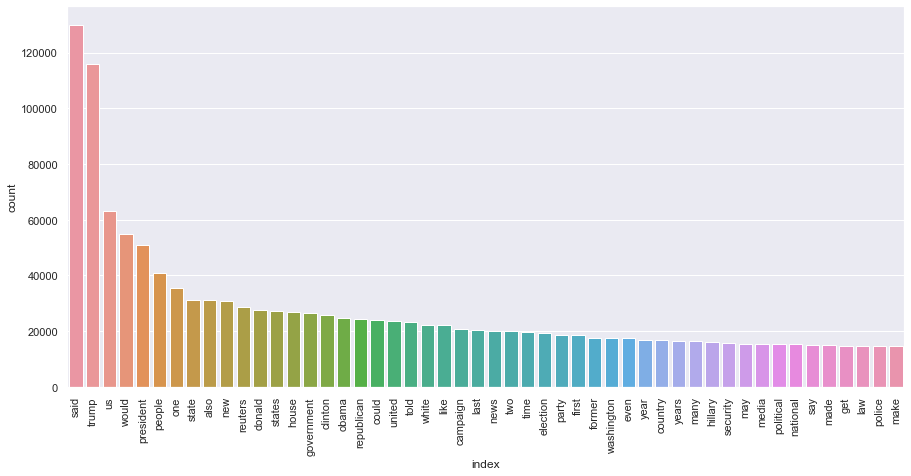

In [217]:
plt.figure(figsize=(15,7))
sns.set(style="darkgrid")
sns.barplot(x="index", y='count', data=top_common_words)
plt.xticks(rotation=90)

## Lemmatisation

### La lemmatisation est le processus de regroupement des différentes formes fléchies d'un mot afin qu'elles puissent être analysées comme un seul élément. La lemmatisation est similaire à la radicalisation mais elle apporte un contexte aux mots. Donc, elle relie des mots ayant une signification similaire entre eux.

In [218]:
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

In [219]:
lemm = WordNetLemmatizer()

In [220]:
def word_lemmatizer(text):
    token_text = nltk.word_tokenize(text)
    remove_stop = [lemm.lemmatize(w) for w in token_text]
    join_text = ' '.join(remove_stop)
    return join_text

In [221]:
lemmatize_data = stopword_df.copy()
lemmatize_data['text'] = stopword_df.text.apply(lambda x : word_lemmatizer(x))
lemmatize_data.head()

,title,text,subject,date,Cible
0,"As U.S. budget fight looms, Republicans flip t...",washington reuters head conservative republica...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,washington reuters transgender people allowed ...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,washington reuters special counsel investigati...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,washington reuters trump campaign adviser geor...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,seattlewashington reuters president donald tru...,politicsNews,"December 29, 2017",1


# Nettoyage des Fake news avec Word2vec et LSTM

In [444]:
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
import re

In [445]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

In [446]:
df_true.head()

,title,text,subject,date,Cible
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1


In [447]:
# Première création d'une liste d'index qui n'ont pas de partie publication
unknown_publishers = []
for index,row in enumerate(df_true.text.values):
    try:
        record = row.split(" -", maxsplit=1)
        # si aucune partie de texte n'est présente, la suite donnera une erreur
        record[1]
        # si le len de la partie piblication est supérieur à 260
        # La suite donnera une erreur, garantissant qu'aucun texte ayant "-" entre les deux n'est compté
        assert(len(record[0]) < 260)
    except:
        unknown_publishers.append(index)

In [448]:
# Ainsi, nous avons une liste d'indices où l'éditeur n'est pas mentionné
#Vérifions
df_true.iloc[unknown_publishers].text
# Vrai, ils n'ont pas de texte comme "WASHINGTON (Reuters)"

3488     The White House on Wednesday disclosed a group...
4358     Neil Gorsuch, President Donald Trump’s appoint...
4465     WASHINGTON The clock began running out this we...
5784     Federal appeals court judge Neil Gorsuch, the ...
6660     Republican members of Congress are complaining...
6823     Over the course of the U.S. presidential campa...
7922     After going through a week reminiscent of Napo...
8194     The following timeline charts the origin and s...
8195     Global health officials are racing to better u...
8247     U.S. President Barack Obama visited a street m...
8465     ALGONAC, MICH.—Parker Fox drifted out of the D...
8481     Global health officials are racing to better u...
8482     The following timeline charts the origin and s...
8505     Global health officials are racing to better u...
8506     The following timeline charts the origin and s...
8771     In a speech weighted with America’s complicate...
8970                                                    

In [449]:
# Séparation des informations de publication, à partir du texte réel
publisher = []
tmp_text = []
for index,row in enumerate(df_true.text.values):
    if index in unknown_publishers:
        #Ajoutons un éditeur inconnu non mentionné
        tmp_text.append(row)
        
        publisher.append("Unknown")
        continue
    record = row.split(" -", maxsplit=1)
    publisher.append(record[0])
    tmp_text.append(record[1])

In [450]:
# Remplaçons la colonne de texte existante par un nouveau texte
# Ajoutons une colonne séparée pour les informations de publication
df_true["publisher"] = publisher
df_true["text"] = tmp_text

del publisher, tmp_text, record, unknown_publishers

In [451]:
df_true.head()

,title,text,subject,date,Cible,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction...,politicsNews,"December 31, 2017",1,WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fi...,politicsNews,"December 29, 2017",1,WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links be...,politicsNews,"December 31, 2017",1,WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos to...,politicsNews,"December 30, 2017",1,WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Pos...,politicsNews,"December 29, 2017",1,SEATTLE/WASHINGTON (Reuters)


Différence dans le texte

Les Real News semblent avoir une source de publication qui n'est pas présente dans les Fake News

En regardant les données :

- La plupart des textes contiennent des informations de Reuters telles que "WASHINGTON (Reuters)".

- Certains textes sont des tweets 

- Peu de textes ne contiennent aucune information sur la publication

# Prétraitement de texte

In [218]:
df = pd.concat([df_true, df_fake], ignore_index=True, sort=False)
df.head()

,title,text,subject,date,Cible
0,"As U.S. budget fight looms, Republicans flip t...",WASHINGTON (Reuters) - The head of a conservat...,politicsNews,"December 31, 2017",1
1,U.S. military to accept transgender recruits o...,WASHINGTON (Reuters) - Transgender people will...,politicsNews,"December 29, 2017",1
2,Senior U.S. Republican senator: 'Let Mr. Muell...,WASHINGTON (Reuters) - The special counsel inv...,politicsNews,"December 31, 2017",1
3,FBI Russia probe helped by Australian diplomat...,WASHINGTON (Reuters) - Trump campaign adviser ...,politicsNews,"December 30, 2017",1
4,Trump wants Postal Service to charge 'much mor...,SEATTLE/WASHINGTON (Reuters) - President Donal...,politicsNews,"December 29, 2017",1


In [219]:
y = df["Cible"].values
# Convertissons X au format acceptable par gensim, en supprimant les stopwords et les signes de ponctuation dans le processus
X = []
stop_words = set(nltk.corpus.stopwords.words("english"))
tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')
for par in df["text"].values:
    tmp = []
    sentences = nltk.sent_tokenize(par)
    for sent in sentences:
        sent = sent.lower()
        tokens = tokenizer.tokenize(sent)
        filtered_words = [w.strip() for w in tokens if w not in stop_words and len(w) > 1]
        tmp.extend(filtered_words)
    X.append(tmp)

del df

# Vectorisation - Word2Vec

### Créons et vérifions notre propre modèle Word2Vec avec gensim

In [220]:
import gensim

In [221]:
# Dimension des vecteurs que nous générons
EMBEDDING_DIM = 100

# Création des vecteurs de mots par la méthode Word2Vec 
w2v_model = gensim.models.Word2Vec(sentences=X, size=EMBEDDING_DIM, window=5, min_count=1)

In [222]:
# Taille du vocabulaire
len(w2v_model.wv.vocab)
#Nous avons maintenant représenté chacun des 122248 mots par un vecteur de dimenssion 100.

121858

In [223]:
# Voyons un exemple de vecteur pour un mot aléatoire, disons Corona
w2v_model["corona"]

<ipython-input-223-5c8a24501852>:2: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  w2v_model["corona"]


array([-0.00877738,  0.02781407, -0.02402796,  0.01261295, -0.00050478,
       -0.05835003,  0.05226188, -0.03027494,  0.02480586,  0.00109704,
       -0.01191952,  0.00237038, -0.08015038,  0.07797032, -0.02572331,
        0.03917696,  0.02712547, -0.0659086 , -0.01165176,  0.05435736,
        0.01813329, -0.03528098, -0.01001804, -0.04457927,  0.05172179,
        0.0630953 ,  0.05416486, -0.01970744, -0.09193247,  0.08182436,
       -0.00846432, -0.03755479,  0.0196384 ,  0.01369482,  0.01030537,
        0.0259304 , -0.04960098,  0.0555964 ,  0.01494775, -0.03544965,
        0.03936849, -0.10356642, -0.0341008 , -0.06217026,  0.00079987,
       -0.04649021,  0.05697456, -0.01698718, -0.01328851, -0.02809508,
        0.08327851, -0.00900717,  0.02069467,  0.02937401,  0.04915853,
        0.05691236,  0.00630128,  0.01847406, -0.06228661,  0.03596189,
       -0.01001284, -0.01984145,  0.06124186, -0.02865879,  0.01372279,
        0.10788367, -0.03261907,  0.07931428, -0.06244874,  0.01

In [225]:
w2v_model.wv.most_similar("virus")

[('zika', 0.9063567519187927),
 ('mosquito', 0.8204137086868286),
 ('outbreak', 0.8151417970657349),
 ('ebola', 0.7979274988174438),
 ('disease', 0.7728655338287354),
 ('infection', 0.7667602896690369),
 ('cholera', 0.7665505409240723),
 ('infections', 0.7472283840179443),
 ('diseases', 0.7255145311355591),
 ('cdc', 0.7086330056190491)]

In [227]:
w2v_model.wv.most_similar("war")

[('wars', 0.7403794527053833),
 ('disobedience', 0.5770846605300903),
 ('blooded', 0.5556564331054688),
 ('nafeez', 0.5197947025299072),
 ('conflict', 0.5164707899093628),
 ('wwii', 0.5105593204498291),
 ('invasion', 0.5066537857055664),
 ('hostilities', 0.47882717847824097),
 ('mishal', 0.4786328077316284),
 ('0752', 0.4674389660358429)]

In [228]:
w2v_model.wv.most_similar("data")

[('statistics', 0.720435619354248),
 ('database', 0.6966639757156372),
 ('census', 0.6659725904464722),
 ('databases', 0.6449421644210815),
 ('survey', 0.6407608985900879),
 ('records', 0.635024905204773),
 ('metadata', 0.6098954677581787),
 ('estimates', 0.6058295965194702),
 ('analysis', 0.5984019041061401),
 ('documents', 0.5951979160308838)]

In [229]:
w2v_model.wv.most_similar("computer")

[('computers', 0.8482437133789062),
 ('software', 0.7889044284820557),
 ('malware', 0.7820473909378052),
 ('laptop', 0.7530609369277954),
 ('electronic', 0.7501970529556274),
 ('scanning', 0.7400108575820923),
 ('devices', 0.7337143421173096),
 ('servers', 0.7177962064743042),
 ('encrypted', 0.7140975594520569),
 ('detection', 0.7010359764099121)]

In [230]:
# Présidents américains
w2v_model.wv.most_similar(positive=["trump","obama", "clinton"])
# Le premier était Bush

[('bush', 0.5536316633224487),
 ('cruz', 0.524567186832428),
 ('elect', 0.5210379958152771),
 ('incoming', 0.4983610510826111),
 ('hillary', 0.4981050491333008),
 ('course', 0.48895055055618286),
 ('crooked', 0.4825519621372223),
 ('actually', 0.465655654668808),
 ('dithering', 0.4655790328979492),
 ('obamahe', 0.4610917568206787)]

En regardant les mots similaires, les vecteurs sont bien formés pour ces mots:

Ces vecteurs seront transmis à LSTM / GRU au lieu de mots. 1D-CNN peut en outre être utilisé pour extraire des caractéristiques des vecteurs.

Keras a une implémentation appelée "Embedding Layer" qui créerait des embeddings de mots (vecteurs). Puisque nous avons fait cela avec word2vec de gensim, nous allons charger ces vecteurs dans la couche d'intégration et rendre la couche non entraînable.

Nous ne pouvons pas transmettre de chaînes de mots au calque d'intégration, nous avons donc besoin d'un moyen de représenter chaque mot par des nombres.

Tokenizer peut représenter chaque mot par un numéro.

In [463]:
# Tokenizing Text -> Répétition de chaque mot par un nombre
# Le mappage du mot original au nombre est conservé dans la propriété word_index du tokenizer

# Tokenizer applique un traitement de base soit, le changer en minuscules en définissant explicitement cela comme False
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)

X = tokenizer.texts_to_sequences(X)

In [464]:
# Vérifions les 10 premiers mots de la première actualité
# Chaque mot a été représenté par un nombre
X[0][:10]

[318, 208, 16, 6038, 104, 692, 151, 1106, 2838, 44]

In [465]:
# Vérifions quelques mots à la réplesentation numérique
# Mapping est conservé dans le dictionnaire -> propriété word_index de l'instance
word_index = tokenizer.word_index
for word, num in word_index.items():
    print(f"{word} -> {num}")
    if num == 10:
        break

trump -> 1
said -> 2
president -> 3
would -> 4
people -> 5
one -> 6
state -> 7
also -> 8
new -> 9
clinton -> 10


Remarquons qu'il commence par 1

Nous pouvons transmettre la représentation numérique des mots au réseau neuronal.

Nous pouvons utiliser le modèle Many-To-One (Sequence-To-Word) de RNN, car nous avons beaucoup de mots dans les articles comme une entrée et une sortie, c'est-à-dire la probabilité d'être réel.

Pour le modèle Many-To-One, utilisons une entrée de taille fixe.

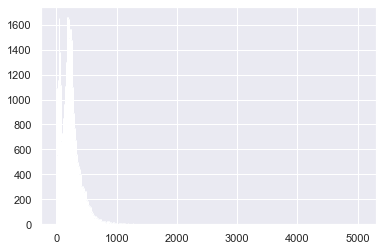

In [466]:
# Pour déterminer la taille de l'entrée ...

# Faisons un histogramme pour un nombre de mots dans les articles 

plt.hist([len(x) for x in X], bins=500)
plt.show()

# Est-ce biaisé? Y a t-il des nouvelles avec 5000 mots? Peut-on tronquer les valeurs aberrantes?

In [467]:
nos = np.array([len(x) for x in X])
len(nos[nos  < 700])
# Sur 48k nouvelles, 44k contiennent moins de 700 mots

44027

In [468]:
# Gardons toutes les nouvelles à 700, ajoutons du remplissage aux nouvelles de moins de 700 mots et tronquons les longs
maxlen = 700 

# Faisons apparaitre toutes les nouvelles de taille maxlen définie ci-dessus
X = pad_sequences(X, maxlen=maxlen)

In [469]:
# Toutes les nouvelles contiennent 700 mots(sous forme numérique maintenant).
# S'ils avaient moins de mots, ils ont été complétés avec 0.
# 0 n'est associé à aucun mot, car le mappage des mots a commencé à partir de 1.
# 0 sera également utilisé plus tard, si un mot inconnu est rencontré dans l'ensemble de test.
len(X[0])

700

In [470]:
# Ajout de 1 à cause de l'index 0 réservé
# Embedding Layer crée un vecteur supplémentaire pour les mots "INCONNUS" ou les mots remplis (0). 
# Ce vecteur est rempli de zéros.
# Ainsi, la taille de notre vocabulaire augmente de 1.
vocab_size = len(tokenizer.word_index) + 1

In [471]:
# Fonction pour créer une matrice de poids à partir du modèle de gensim word2vec
def get_weight_matrix(model, vocab):
    # Taille totale du vocabulaire plus 0 pour les mots inconnus
    vocab_size = len(vocab) + 1
    # définir les dimensions de la matrice de poids 0
    weight_matrix = np.zeros((vocab_size, EMBEDDING_DIM))
    # step vocab, stocker des vecteurs en utilisant le mappage d'entiers du Tokenizer
    for word, i in vocab.items():
        weight_matrix[i] = model[word]
    return weight_matrix

Nous créons une matrice de correspondance entre les mots-index et les vecteurs. Nous l'utilisons comme poids dans la couche d'incorporation

La couche d'incorporation accepte le token numérique de mot et renvoie le vercor correspondant à la couche interne.

Il envoie un vecteur de zéros à la couche suivante pour les mots inconnus qui seraient tokenisés à 0.

La longueur d'entrée de la couche d'intégration est la longueur de chaque nouvelle (700 maintenant en raison du remplissage et de la troncature)

In [472]:
from keras.layers import Embedding
from keras.models import Sequential                                    
from keras.layers import Flatten, Dense   

In [473]:
# Obtenir des vecteurs d'incorporation à partir de word2vec et les utiliser comme poids de la couche d'incorporation 
# de keras non entraînable
embedding_vectors = get_weight_matrix(w2v_model, word_index)

In [474]:
# Définition du réseau neuronal
model = Sequential()

# Couche d'intégration non formable
model.add(Embedding(vocab_size, output_dim=EMBEDDING_DIM, weights=[embedding_vectors], input_length=maxlen, trainable=False))

#LSTM 
model.add(LSTM(units=128))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

del embedding_vectors

In [475]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_5 (Embedding)      (None, 700, 100)          12173800  
_________________________________________________________________
lstm_3 (LSTM)                (None, 128)               117248    
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 129       
Total params: 12,291,177
Trainable params: 117,377
Non-trainable params: 12,173,800
_________________________________________________________________


In [264]:
#Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y) 

In [265]:
model.fit(X_train, y_train, validation_split=0.3, epochs=3)

Epoch 1/3
737/737 [==============================] - 462s 622ms/step - loss: 0.1756 - acc: 0.9307 - val_loss: 0.0944 - val_acc: 0.9651
Epoch 2/3
737/737 [==============================] - 443s 600ms/step - loss: 0.0647 - acc: 0.9775 - val_loss: 0.0582 - val_acc: 0.9803
Epoch 3/3
737/737 [==============================] - 354s 480ms/step - loss: 0.0535 - acc: 0.9819 - val_loss: 0.0558 - val_acc: 0.9812


In [266]:
# La prédiction est une probabilité que les nouvelles soient réelles, donc la conversion en classe
# Classe 0 (Faux) si prob prédite <0,5, sinon classe 1 (Réel)
y_pred = (model.predict(X_test) >= 0.5).astype("int")

In [267]:
accuracy_score(y_test, y_pred)

0.9832516703786192

In [268]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      5874
           1       0.98      0.98      0.98      5351

    accuracy                           0.98     11225
   macro avg       0.98      0.98      0.98     11225
weighted avg       0.98      0.98      0.98     11225



## Modèles d'apprentissage automatique pour la classification de texte

- Dans cet article, nous avons d'abord effacé les textes tels que les URL et diverses balises.

- En outre, nous avons utilisé diverses techniques de mise en valeur de texte comme le bag of words, tf-idf et word2vec.

- Après avoir travaillé la fonctionnalité de texte, nous construisons des modèles d'apprentissage automatique en plus de ces fonctionnalités.


In [294]:
df_true['Cible'] = 1
df_fake['Cible'] = 0
df = pd.concat([df_true, df_fake]).reset_index(drop = True)
df['original'] = df['title'] + ' ' + df['text']
df.head()

,title,text,subject,date,Cible,publisher,original
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction...,politicsNews,"December 31, 2017",1,WASHINGTON (Reuters),"As U.S. budget fight looms, Republicans flip t..."
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fi...,politicsNews,"December 29, 2017",1,WASHINGTON (Reuters),U.S. military to accept transgender recruits o...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links be...,politicsNews,"December 31, 2017",1,WASHINGTON (Reuters),Senior U.S. Republican senator: 'Let Mr. Muell...
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos to...,politicsNews,"December 30, 2017",1,WASHINGTON (Reuters),FBI Russia probe helped by Australian diplomat...
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Pos...,politicsNews,"December 29, 2017",1,SEATTLE/WASHINGTON (Reuters),Trump wants Postal Service to charge 'much mor...


## Bag of Words (BoW)

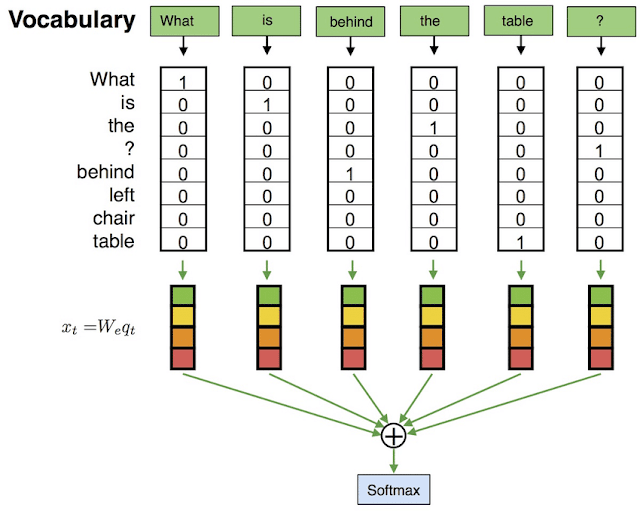

In [295]:
# Affichage de la forme de la cote
df.head()

,title,text,subject,date,Cible,publisher,original
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction...,politicsNews,"December 31, 2017",1,WASHINGTON (Reuters),"As U.S. budget fight looms, Republicans flip t..."
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fi...,politicsNews,"December 29, 2017",1,WASHINGTON (Reuters),U.S. military to accept transgender recruits o...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links be...,politicsNews,"December 31, 2017",1,WASHINGTON (Reuters),Senior U.S. Republican senator: 'Let Mr. Muell...
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos to...,politicsNews,"December 30, 2017",1,WASHINGTON (Reuters),FBI Russia probe helped by Australian diplomat...
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Pos...,politicsNews,"December 29, 2017",1,SEATTLE/WASHINGTON (Reuters),Trump wants Postal Service to charge 'much mor...


In [296]:
# Echantillonnage du nombre de lignes

df0 = df[df['Cible']==0].sample(2000)
df1 = df[df['Cible']==1].sample(2000)

In [297]:
dfr = df0.append(df1)

In [298]:
dfr.shape

(4000, 7)

In [299]:
# Suppression des colonnes twitts, sentiments et e-mails

dfr_feat = dfr.drop(labels=['text','Cible'], axis = 1).reset_index(drop=True)

In [300]:
dfr_feat.head()

,title,subject,date,publisher,original
0,STEVE JOBS’ WIDOW ANNOUNCES SUPPORT FOR “Revol...,politics,"Apr 16, 2015",NaN,STEVE JOBS’ WIDOW ANNOUNCES SUPPORT FOR “Revol...
1,These Americans Actually Believe Martin Luthe...,News,"January 19, 2016",NaN,These Americans Actually Believe Martin Luthe...
2,Gawker Fools Trump Into Quoting Genocidal Man...,News,"February 28, 2016",NaN,Gawker Fools Trump Into Quoting Genocidal Man...
3,Ron Paul on Burns Oregon Standoff and Jury Nul...,US_News,"January 21, 2016",NaN,Ron Paul on Burns Oregon Standoff and Jury Nul...
4,THE FUTURE BELONGS To AI And Whoever Masters I...,politics,"Sep 4, 2017",NaN,THE FUTURE BELONGS To AI And Whoever Masters I...


In [476]:
y = dfr['Cible']

In [477]:
from sklearn.feature_extraction.text import CountVectorizer


In [478]:
cv = CountVectorizer()
text_counts = cv.fit_transform(dfr['text'])

In [479]:
text_counts.toarray().shape

(4000, 41835)

In [480]:
dfr_bow = pd.DataFrame(text_counts.toarray(), columns=cv.get_feature_names())
dfr_bow.head(2)

,00,000,0000,000063,000938,000american,000th,001,0018,0019,...,zweig,zwillich,zwillig,zx2sogdvl6,zx7gkfbuv4,zxumywnnhv,zyifjwyfdh,zz7greitgoo,zzjjpdaivn,zzqvyk8xif
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Machine learning - Algorithmes

In [306]:
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LogisticRegressionCV
from sklearn.svm import LinearSVC
from sklearn.ensemble import RandomForestClassifier


from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.preprocessing import MinMaxScaler

In [307]:
sgd = SGDClassifier(n_jobs=-1, random_state=42, max_iter=200)
lgr = LogisticRegression(random_state=42, max_iter=200)
lgrcv = LogisticRegressionCV(cv = 2, random_state=42, max_iter=1000)
svm = LinearSVC(random_state=42, max_iter=200)
rfc = RandomForestClassifier(random_state=42, n_jobs=-1, n_estimators=200)

In [308]:
clf = {'SGD': sgd, 'LGR': lgr, 'LGR-CV': lgrcv, 'SVM': svm, 'RFC': rfc}

In [309]:
clf.keys()

dict_keys(['SGD', 'LGR', 'LGR-CV', 'SVM', 'RFC'])

In [310]:
# Ici, nous formons notre modèle en définissant la fonction classify.
def classify(X, y):
    scaler = MinMaxScaler(feature_range=(0, 1))
    X = scaler.fit_transform(X)
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42, stratify = y)
    
    for key in clf.keys():
        clf[key].fit(X_train, y_train)
        y_pred = clf[key].predict(X_test)
        ac = accuracy_score(y_test, y_pred)
        print(key, " ---> ", ac)

In [311]:
%%time
classify(dfr_bow, y)

SGD  --->  0.94875
LGR  --->  0.96
LGR-CV  --->  0.9525
SVM  --->  0.93
RFC  --->  0.9575
Wall time: 1min 30s


## TF-IDF

In [312]:
# Passer toutes les fonctionnalités manuelles avec les fonctionnalités tfidf.
from sklearn.feature_extraction.text import TfidfVectorizer

In [313]:
dfr.shape

(4000, 7)

In [314]:
tfidf = TfidfVectorizer()
X = tfidf.fit_transform(dfr['text'])

In [315]:
%%time
classify(pd.DataFrame(X.toarray()), y)

SGD  --->  0.9675
LGR  --->  0.9675
LGR-CV  --->  0.97125
SVM  --->  0.96625
RFC  --->  0.96125
Wall time: 1min 20s


## Analyse N-Gram 

In [316]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
import re
import string

In [317]:
def clean_train_data(x):
    text = x
    text = text.lower()
    text = re.sub('\[.*?\]', '', text) 
    text = re.sub(r'[^\w\s]','',text) 
    text = re.sub('\w*\d\w*', '', text) 
    text = re.sub(r'http\S+', '', text)
    text = re.sub('\n', '', text)
    return text

In [318]:
clean_df = df.copy()
clean_df['text'] = df.text.apply(lambda x : clean_train_data(x))
clean_df.head()

,title,text,subject,date,Cible,publisher,original
0,"As U.S. budget fight looms, Republicans flip t...",the head of a conservative republican faction...,politicsNews,"December 31, 2017",1,WASHINGTON (Reuters),"As U.S. budget fight looms, Republicans flip t..."
1,U.S. military to accept transgender recruits o...,transgender people will be allowed for the fi...,politicsNews,"December 29, 2017",1,WASHINGTON (Reuters),U.S. military to accept transgender recruits o...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,the special counsel investigation of links be...,politicsNews,"December 31, 2017",1,WASHINGTON (Reuters),Senior U.S. Republican senator: 'Let Mr. Muell...
3,FBI Russia probe helped by Australian diplomat...,trump campaign adviser george papadopoulos to...,politicsNews,"December 30, 2017",1,WASHINGTON (Reuters),FBI Russia probe helped by Australian diplomat...
4,Trump wants Postal Service to charge 'much mor...,president donald trump called on the us posta...,politicsNews,"December 29, 2017",1,SEATTLE/WASHINGTON (Reuters),Trump wants Postal Service to charge 'much mor...


In [319]:
clean_df.tail()

,title,text,subject,date,Cible,publisher,original
44893,McPain: John McCain Furious That Iran Treated ...,century wire says as reported earlier this w...,Middle-east,"January 16, 2016",0,NaN,McPain: John McCain Furious That Iran Treated ...
44894,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,century wire says it s a familiar theme whene...,Middle-east,"January 16, 2016",0,NaN,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...
44895,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,patrick henningsen century wireremember when...,Middle-east,"January 15, 2016",0,NaN,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...
44896,How to Blow $700 Million: Al Jazeera America F...,century wire says al jazeera america will go ...,Middle-east,"January 14, 2016",0,NaN,How to Blow $700 Million: Al Jazeera America F...
44897,10 U.S. Navy Sailors Held by Iranian Military ...,century wire says as predicted in its new ye...,Middle-east,"January 12, 2016",0,NaN,10 U.S. Navy Sailors Held by Iranian Military ...


In [320]:
clean_df[clean_df['Cible'] == 0]['text'][25000]

'conservatives are damned liars and they need to be called out every time they claim donald trump s campaign wasn t racistthroughout the  presidential campaign donald trump constantly winked and nodded at white supremacists and white nationalists to the point where they threw their support to his campaign and starting showing up at his ralliesin fact the only group of voters that donald trump did not insult or denounce were white racists while he consistently spewed hateful and discriminatory rhetoric at latinos black people and muslimsit is common knowledge that racism was a key part of trump s vicious campaign but trump supporter betsy mccaughey repeatedly claimed otherwise and actually had the gall to accuse democrats of being the real racists during a saturday appearance on cnn with democratic counterpart symone sanders who is black i think the campaign has been very gracious in victory  mccaughey claimed  but what disturbs me the most is to see the democratic party leaders and spo

In [321]:
df_fake['text'][1]

'House Intelligence Committee Chairman Devin Nunes is going to have a bad day. He s been under the assumption, like many of us, that the Christopher Steele-dossier was what prompted the Russia investigation so he s been lashing out at the Department of Justice and the FBI in order to protect Trump. As it happens, the dossier is not what started the investigation, according to documents obtained by the New York Times.Former Trump campaign adviser George Papadopoulos was drunk in a wine bar when he revealed knowledge of Russian opposition research on Hillary Clinton.On top of that, Papadopoulos wasn t just a covfefe boy for Trump, as his administration has alleged. He had a much larger role, but none so damning as being a drunken fool in a wine bar. Coffee boys  don t help to arrange a New York meeting between Trump and President Abdel Fattah el-Sisi of Egypt two months before the election. It was known before that the former aide set up meetings with world leaders for Trump, but team Tr

In [322]:
eng_stopwords = nltk.corpus.stopwords.words("english")

In [323]:
def remove_eng_stopwords(text):
    token_text = nltk.word_tokenize(text)
    remove_stop = [word for word in token_text if word not in eng_stopwords]
    join_text = ' '.join(remove_stop)
    return join_text

In [324]:
stopword_df = clean_df.copy()
stopword_df['text'] = clean_df.text.apply(lambda x : remove_eng_stopwords(x))
stopword_df.head()

,title,text,subject,date,Cible,publisher,original
0,"As U.S. budget fight looms, Republicans flip t...",head conservative republican faction us congre...,politicsNews,"December 31, 2017",1,WASHINGTON (Reuters),"As U.S. budget fight looms, Republicans flip t..."
1,U.S. military to accept transgender recruits o...,transgender people allowed first time enlist u...,politicsNews,"December 29, 2017",1,WASHINGTON (Reuters),U.S. military to accept transgender recruits o...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,special counsel investigation links russia pre...,politicsNews,"December 31, 2017",1,WASHINGTON (Reuters),Senior U.S. Republican senator: 'Let Mr. Muell...
3,FBI Russia probe helped by Australian diplomat...,trump campaign adviser george papadopoulos tol...,politicsNews,"December 30, 2017",1,WASHINGTON (Reuters),FBI Russia probe helped by Australian diplomat...
4,Trump wants Postal Service to charge 'much mor...,president donald trump called us postal servic...,politicsNews,"December 29, 2017",1,SEATTLE/WASHINGTON (Reuters),Trump wants Postal Service to charge 'much mor...


## Trouvons les mots courants

In [325]:
from itertools import chain
from collections import Counter

In [326]:
list_words = stopword_df['text'].str.split()
list_words_merge = list(chain(*list_words))

d = Counter(list_words_merge)
df = pd.DataFrame(data=d, index=['count'])
top_common_words = df.T.sort_values(by=['count'], ascending=False).reset_index().head(50)
top_common_words.head()

,index,count
0,said,130048
1,trump,115768
2,us,62993
3,would,54927
4,president,50907


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),
 [Text(0, 0, 'said'),
  Text(1, 0, 'trump'),
  Text(2, 0, 'us'),
  Text(3, 0, 'would'),
  Text(4, 0, 'president'),
  Text(5, 0, 'people'),
  Text(6, 0, 'one'),
  Text(7, 0, 'state'),
  Text(8, 0, 'also'),
  Text(9, 0, 'new'),
  Text(10, 0, 'donald'),
  Text(11, 0, 'states'),
  Text(12, 0, 'house'),
  Text(13, 0, 'government'),
  Text(14, 0, 'clinton'),
  Text(15, 0, 'obama'),
  Text(16, 0, 'republican'),
  Text(17, 0, 'could'),
  Text(18, 0, 'told'),
  Text(19, 0, 'united'),
  Text(20, 0, 'white'),
  Text(21, 0, 'like'),
  Text(22, 0, 'campaign'),
  Text(23, 0, 'last'),
  Text(24, 0, 'news'),
  Text(25, 0, 'two'),
  Text(26, 0, 'time'),
  Text(27, 0, 'election'),
  Text(28, 0, 'party'),
  Text(29, 0, 'first'),
  Text(30, 0, 'former'),
  Text(31, 0, 'even'),
  Text

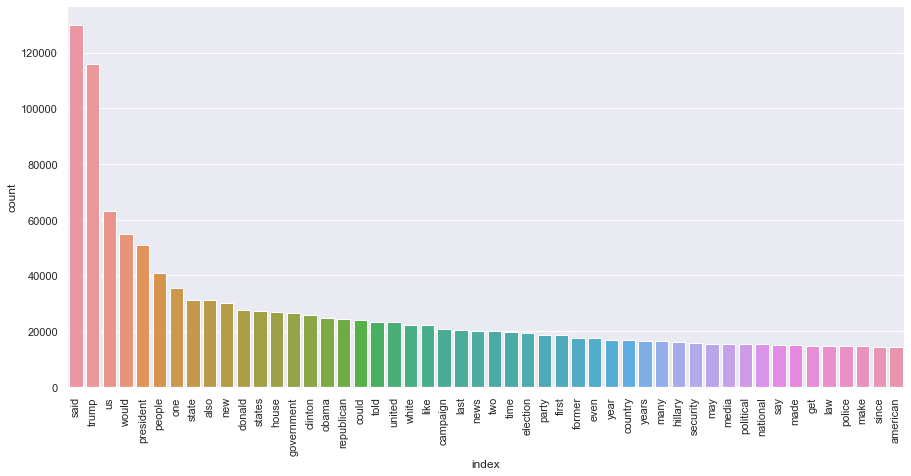

In [327]:
plt.figure(figsize=(15,7))
sns.set(style="darkgrid")
sns.barplot(x="index", y='count', data=top_common_words)
plt.xticks(rotation=90)

# Topic Modeling avec Gensim

Le Topic Modeling est une technique de classification qui repose sur un modèle probabiliste hiérarchique que nous appliquons en utilisant la méthode LDA (Latent Dirichlet Allocation). Latent Dirichlet Allocation (LDA) est un algorithme populaire pour la modélisation de sujet avec d'excellentes mises en œuvre dans le package Gensim (Python). Le défi cependant est de savoir comment extraire des sujets de bonne qualité qui sont clairs, séparés et significatifs. Cela dépend fortement de la qualité du prétraitement du texte et de la stratégie de recherche du nombre optimal de sujets.

In [390]:
# Importer des packages
import nltk; nltk.download('stopwords')
import re
import numpy as np
import pandas as pd
from pprint import pprint

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel

# spacy pour la lemmatisation
import spacy

# Outils de traçage
import pyLDAvis
import pyLDAvis.gensim  # don't skip this
import matplotlib.pyplot as plt
%matplotlib inline

# Activer la journalisation pour gensim - facultatif
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)

import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\phamd\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [391]:
# NLTK Stop words
from nltk.corpus import stopwords
stop_words = stopwords.words('english')
stop_words.extend(['from', 'subject', 're', 'edu', 'use'])

In [ ]:
# Importer les datasets
df_true = pd.read_csv("D:/Real_news.csv")
df_fake = pd.read_csv("D:/Fake_news.csv")

In [392]:
df_true['Cible'] = 1
df_fake['Cible'] = 0
df = pd.concat([df_true, df_fake]).reset_index(drop = True)
df['original'] = df['title'] + ' ' + df['text']
df.head()

,title,text,subject,date,Cible,publisher,label,original
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction...,politicsNews,"December 31, 2017",1,WASHINGTON (Reuters),True,"As U.S. budget fight looms, Republicans flip t..."
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fi...,politicsNews,"December 29, 2017",1,WASHINGTON (Reuters),True,U.S. military to accept transgender recruits o...
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links be...,politicsNews,"December 31, 2017",1,WASHINGTON (Reuters),True,Senior U.S. Republican senator: 'Let Mr. Muell...
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos to...,politicsNews,"December 30, 2017",1,WASHINGTON (Reuters),True,FBI Russia probe helped by Australian diplomat...
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Pos...,politicsNews,"December 29, 2017",1,SEATTLE/WASHINGTON (Reuters),True,Trump wants Postal Service to charge 'much mor...


Comme vous pouvez le voir, de nombreux e-mails, nouvelles lignes et espaces supplémentaires sont assez distrayants.
Nous nous en débarrassons à l'aide d'expressions régulières.

In [394]:
# Convertir en liste
data = df.text.values.tolist()

# Supprimer les emails
data = [re.sub('\S*@\S*\s?', '', sent) for sent in data]

# Supprimer les caractères de nouvelle ligne
data = [re.sub('\s+', ' ', sent) for sent in data]

# Supprimer les parenthèses ou les guillemets
data = [re.sub("\'", "", sent) for sent in data]

pprint(data[:1])

[' The head of a conservative Republican faction in the U.S. Congress, who '
 'voted this month for a huge expansion of the national debt to pay for tax '
 'cuts, called himself a “fiscal conservative” on Sunday and urged budget '
 'restraint in 2018. In keeping with a sharp pivot under way among '
 'Republicans, U.S. Representative Mark Meadows, speaking on CBS’ “Face the '
 'Nation,” drew a hard line on federal spending, which lawmakers are bracing '
 'to do battle over in January. When they return from the holidays on '
 'Wednesday, lawmakers will begin trying to pass a federal budget in a fight '
 'likely to be linked to other issues, such as immigration policy, even as the '
 'November congressional election campaigns approach in which Republicans will '
 'seek to keep control of Congress. President Donald Trump and his Republicans '
 'want a big budget increase in military spending, while Democrats also want '
 'proportional increases for non-defense “discretionary” spending on p

Après avoir supprimé les emails et les espaces supplémentaires, le texte semble toujours désordonné, donc, il n'est pas prêt à analyser par la LDA. Nous décomposons chaque phrase en une liste de mots par tokenisation, tout en effaçant tout le texte en désordre dans le processus. Donc, nous utilison gensim pour cela.

Nous tokenisons chaque phrase dans une liste de mots, supprimant complètement les ponctuations et les caractères inutiles.

In [395]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))  # deacc=True removes punctuations

data_words = list(sent_to_words(data))

print(data_words[:1])

[['the', 'head', 'of', 'conservative', 'republican', 'faction', 'in', 'the', 'congress', 'who', 'voted', 'this', 'month', 'for', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax', 'cuts', 'called', 'himself', 'fiscal', 'conservative', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', 'in', 'keeping', 'with', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans', 'representative', 'mark', 'meadows', 'speaking', 'on', 'cbs', 'face', 'the', 'nation', 'drew', 'hard', 'line', 'on', 'federal', 'spending', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'federal', 'budget', 'in', 'fight', 'likely', 'to', 'be', 'linked', 'to', 'other', 'issues', 'such', 'as', 'immigration', 'policy', 'even', 'as', 'the', 'november', 'congressional', 'election', 'campaigns', 'approach', 'in', 'which', 'rep

In [396]:
# Créer les modèles bigramme et trigramme
bigram = gensim.models.Phrases(data_words, min_count=5, threshold=100) # higher threshold fewer phrases.
trigram = gensim.models.Phrases(bigram[data_words], threshold=100)  

In [397]:
# Obtenir une phrase matraquée en trigramme / bigramme
bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

In [398]:
# Voir l'exemple de trigramme
print(trigram_mod[bigram_mod[data_words[0]]])

['the', 'head', 'of', 'conservative', 'republican', 'faction', 'in', 'the', 'congress', 'who', 'voted', 'this', 'month', 'for', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax_cuts', 'called', 'himself', 'fiscal', 'conservative', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', 'in', 'keeping', 'with', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans', 'representative_mark_meadows', 'speaking', 'on', 'cbs', 'face', 'the', 'nation', 'drew', 'hard', 'line', 'on', 'federal', 'spending', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'federal', 'budget', 'in', 'fight', 'likely', 'to', 'be', 'linked', 'to', 'other', 'issues', 'such', 'as', 'immigration', 'policy', 'even', 'as', 'the', 'november', 'congressional', 'election', 'campaigns', 'approach', 'in', 'which', 'republicans',

Nous définissons les fonctions pour supprimer les mots vides, créer des bigrammes et de la lemmatisation et les appeler séquentiellement.

In [399]:
# Définir des fonctions pour les stopwords, les bigrammes, les trigrammes et la lemmatisation
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

def make_trigrams(texts):
    return [trigram_mod[bigram_mod[doc]] for doc in texts]

def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [400]:
# Supprimer des Stop Words
data_words_nostops = remove_stopwords(data_words)

In [401]:
# Formulaire bigrams
data_words_bigrams = make_bigrams(data_words_nostops)

In [402]:
# Initialiser spacy « en » modèle, en ne conservant que le composant tagger (pour l'efficacité)
# python3 -m spacy download en
nlp = spacy.load("en_core_web_sm")

In [403]:
# Faire la lemmatisation en ne gardant que des noms, des adjectifs, des verbes, des adverbes
data_lemmatized = lemmatization(data_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

In [404]:
print(data_lemmatized[:1])

[['head', 'conservative', 'republican', 'faction', 'congress', 'vote', 'month', 'huge', 'expansion', 'national', 'debt', 'pay', 'tax_cut', 'call', 'fiscal', 'conservative', 'sunday', 'urge', 'budget', 'restraint', 'keep', 'sharp', 'pivot', 'way', 'republican', 'representative', 'mark_meadow', 'speak', 'cbs', 'face', 'nation', 'draw', 'hard', 'line', 'federal', 'spending', 'lawmaker', 'brace', 'battle', 'return', 'holiday', 'wednesday', 'lawmaker', 'begin', 'try', 'pass', 'federal', 'budget', 'fight', 'likely', 'link', 'issue', 'immigration', 'policy', 'even', 'november', 'congressional', 'election', 'campaign', 'approach', 'republican', 'seek', 'keep', 'control', 'congress', 'president', 'donald', 'trump', 'republican', 'want', 'big', 'budget', 'increase', 'military', 'spending', 'also', 'want', 'proportional', 'increase', 'non', 'defense', 'discretionary_spending', 'program', 'support', 'education', 'scientific_research', 'infrastructure', 'public', 'health', 'environmental_protection

Créer le dictionnaire et le corpus nécessaires à la modélisation de sujets. Les deux principales entrées du modèle de sujet LDA sont le dictionnaire (id2word) et le corpus.

In [405]:
# Créer un dictionnaire
id2word = corpora.Dictionary(data_lemmatized)

In [406]:
# Créer un corpus
texts = data_lemmatized

In [407]:
# Fréquence du document (Term Document Frequency)
corpus = [id2word.doc2bow(text) for text in texts]

In [408]:
# Voir le résultat
print(corpus[:1])

[[(0, 1), (1, 2), (2, 1), (3, 3), (4, 1), (5, 1), (6, 3), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 2), (16, 3), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 4), (23, 1), (24, 1), (25, 2), (26, 1), (27, 2), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 2), (36, 2), (37, 3), (38, 2), (39, 1), (40, 1), (41, 1), (42, 3), (43, 1), (44, 2), (45, 3), (46, 2), (47, 1), (48, 3), (49, 1), (50, 4), (51, 1), (52, 1), (53, 1), (54, 1), (55, 2), (56, 1), (57, 1), (58, 1), (59, 2), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1), (76, 1), (77, 1), (78, 1), (79, 1), (80, 3), (81, 1), (82, 2), (83, 3), (84, 1), (85, 2), (86, 1), (87, 1), (88, 1), (89, 1), (90, 1), (91, 3), (92, 1), (93, 2), (94, 1), (95, 1), (96, 1), (97, 1), (98, 1), (99, 1), (100, 1), (101, 1), (102, 1), (103, 6), (104, 1), (105, 1), (106, 1), (107, 1), (108, 1), (109, 2), (110, 3)

Gensim crée un identifiant unique pour chaque mot du document. Le corpus produit illustré ci-dessus est un mappage de (word_id, word_frequency). Par exemple, (0, 1) ci-dessus implique, le mot id 0 apparaît une fois dans le premier document. De même, le mot id 1 apparaît deux fois et ainsi de suite, etc. Ceci est utilisé comme entrée par le modèle LDA.

In [410]:
# Exemple : Voir un mot correspond à un identifiant
id2word[10]

'assistance'

In [412]:
# Exemple : Afficher des textes lisible
[[(id2word[id], freq) for id, freq in cp] for cp in corpus[:1]]

[[('add', 1),
  ('administration', 2),
  ('agree', 1),
  ('aid', 3),
  ('aide', 1),
  ('already', 1),
  ('also', 3),
  ('approach', 1),
  ('approve', 1),
  ('assist', 1),
  ('assistance', 1),
  ('back', 1),
  ('balloon', 1),
  ('battle', 1),
  ('begin', 1),
  ('big', 2),
  ('bill', 3),
  ('boost', 1),
  ('border', 1),
  ('borrow', 1),
  ('brace', 1),
  ('bring', 1),
  ('budget', 4),
  ('budget_deficit', 1),
  ('california', 1),
  ('call', 2),
  ('campaign', 1),
  ('cbs', 2),
  ('chairman', 1),
  ('change', 1),
  ('child', 1),
  ('childhood_arrival', 1),
  ('clean', 1),
  ('clear', 1),
  ('come', 1),
  ('congress', 2),
  ('congressional', 2),
  ('conservative', 3),
  ('control', 2),
  ('corporation', 1),
  ('country', 1),
  ('create', 1),
  ('crowley', 3),
  ('cut', 1),
  ('daca', 2),
  ('debt', 3),
  ('december', 2),
  ('defend', 1),
  ('defense', 3),
  ('deferred_action', 1),
  ('democrat', 4),
  ('democratic', 1),
  ('deportation', 1),
  ('disabled', 1),
  ('discretionary', 1),
  ('d

### Construire le topic-modeling
Pour former le modèle LDA, nous devons également fournir le nombre de sujets en plus du corpus et du dictionnaire.
- En dehors de cela, alpha et eta sont des hyperparamètres qui affectent la rareté des sujets.
- Selon la documentation Gensim, les deux valeurs par défaut sont 1.0 / num_topics avant.
- chunksize est le nombre de documents à utiliser dans chaque bloc d'apprentissage.
- update_every détermine la fréquence des paramètres du modèle doivent être mis à jour et les passes correspondent au nombre total de passes d'entraînement.


In [413]:
lda_model = gensim.models.ldamodel.LdaModel(corpus=corpus,
                                           id2word=id2word,
                                           num_topics=20, 
                                           random_state=100,
                                           update_every=1,
                                           chunksize=100,
                                           passes=10,
                                           alpha='auto',
                                           per_word_topics=True)

### Afficher les rubriques dans le modèle LDA
Le modèle LDA ci-dessus est construit avec 20 sujets différents où chaque sujet est une combinaison de mots-clés et chaque mot-clé apporte une certaine pondération au sujet.Nous pouvons voir les mots-clés pour chaque sujet et la pondération (importance) de chaque mot-clé en utilisant lda_model.print_topics()

In [414]:
# Affichage du mot-clé dans les 10 rubriques
pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

[(0,
  '0.073*"muslim" + 0.053*"country" + 0.047*"immigration" + 0.045*"refugee" + '
  '0.030*"libya" + 0.026*"airport" + 0.023*"immigrant" + 0.021*"united" + '
  '0.018*"christian" + 0.017*"mass"'),
 (1,
  '0.144*"vote" + 0.087*"election" + 0.045*"voter" + 0.043*"poll" + '
  '0.040*"percent" + 0.040*"state" + 0.027*"abortion" + 0.025*"county" + '
  '0.020*"result" + 0.019*"arizona"'),
 (2,
  '0.047*"report" + 0.021*"official" + 0.019*"accord" + 0.018*"news" + '
  '0.017*"source" + 0.016*"say" + 0.015*"department" + 0.015*"release" + '
  '0.015*"security" + 0.012*"agency"'),
 (3,
  '0.086*"company" + 0.033*"sell" + 0.033*"dnc" + 0.031*"technology" + '
  '0.029*"business" + 0.024*"industry" + 0.021*"texas" + 0.020*"buy" + '
  '0.017*"tech" + 0.015*"ceo"'),
 (4,
  '0.104*"love" + 0.081*"border" + 0.059*"wall" + 0.047*"mexico" + '
  '0.038*"concept" + 0.033*"navy" + 0.030*"build" + 0.028*"south" + '
  '0.027*"vietnam" + 0.027*"empire"'),
 (5,
  '0.060*"president" + 0.048*"obama" + 0.018*"

### Interpréter :
- Le topic 0 est représenté par : (0.073*"muslim" + 0.053*"country" + 0.047*"immigration" + 0.045*"refugee" + '
  '0.030*"libya" + 0.026*"airport" + 0.023*"immigrant" + 0.021*"united" + '
  '0.018*"christian" + 0.017*"mass"').
- Cela signifie que les 10 principaux mots clés qui contribuent à ce sujet 0 sont: "muslim", "country", "immigration", "refugee", "libya", "airport", "immigrant", "united", "christian", "mass" et le poids de "muslim" sur le sujet 0 est de 0,281, etc.
- Les pondérations reflètent l'importance d'un mot-clé pour chaque sujet.
- En examinant ces mots clés pour sujet 0, nous pouvons résumer le terme par exemple "la guerre (the war)".
- De même, le terme de sujet 2 est "election", 3 est "nouvelles", etc.

### Calculer le score de perplexité et de cohérence du modèle

La perplexité du modèle et la cohérence du sujet fournissent une mesure pratique pour juger de la qualité d'un topic modeling.

In [416]:
# Calculation du score de perplexité - Mesure de la qualité du modèle : aussi bas que possible.
print('\nScore de perplexité: ', lda_model.log_perplexity(corpus))


Score de perplexité:  -13.495814489847877


In [417]:
# Calculation du score de cohérence
coherence_model_lda = CoherenceModel(model=lda_model, texts=data_lemmatized, dictionary=id2word, coherence='c_v')
coherence_lda = coherence_model_lda.get_coherence()
print('\nScore de cohérence: ', coherence_lda)


Score de cohérence:  0.4800492071578507


### Visualisation des topics et mots-clés

Maintenant, le modèle LDA est construit, l'étape suivante consiste à examiner les topics et les mots-clés associés. Nous utilisons le graphique interactif du package pyLDAvis.

In [418]:
# Visualisation des topics
pyLDAvis.enable_notebook()
vis = pyLDAvis.gensim.prepare(lda_model, corpus, id2word)
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
17     0.257125 -0.085501       1        1  29.500748
8      0.253135 -0.094623       2        1  17.575537
5      0.233762 -0.043877       3        1  11.087110
2      0.240471 -0.003200       4        1   9.130781
14     0.135367  0.006305       5        1   7.338671
12     0.089704  0.316173       6        1   4.718762
18     0.084475 -0.131213       7        1   3.555778
7      0.054774 -0.093462       8        1   3.175153
16    -0.078569  0.144094       9        1   2.238860
13     0.054804  0.306690      10        1   1.696880
0      0.002299 -0.152843      11        1   1.653180
1     -0.039099  0.144632      12        1   1.612435
3     -0.087147 -0.079081      13        1   1.517622
9     -0.079889 -0.037731      14        1   1.398491
10    -0.109242  0.000588      15        1   1.168875
11    -0.115715 -0.071299      16        1   1.127886
4     -0.191632 -0.074970      17        1   0.696773
15    -0.202972 -0.013692      18        1   0.438571
19    -0.239175 -0.020443      19        1   0.276734
6     -0.262477 -0.016548      20        1   0.091153, topic_info=            Term          Freq         Total Category  logprob  loglift
224        trump  89222.000000  89222.000000  Default  30.0000  30.0000
415      clinton  42960.000000  42960.000000  Default  29.0000  29.0000
166    president  65387.000000  65387.000000  Default  28.0000  28.0000
211        state  71278.000000  71278.000000  Default  27.0000  27.0000
184   republican  30993.000000  30993.000000  Default  26.0000  26.0000
...          ...           ...           ...      ...      ...      ...
4927  st_century      0.033093      1.063469  Topic20 -12.4293   3.5304
5767      murder      0.033088      1.062943  Topic20 -12.4294   3.5308
5851   terrorist      0.033089      1.063191  Topic20 -12.4294   3.5306
5849      syrian      0.033089      1.063125  Topic20 -12.4294   3.5306
6056      terror      0.033089      1.063008  Topic20 -12.4294   3.5307

[1056 rows x 6 columns], token_table=      Topic      Freq      Term
term                           
2575      5  0.999668       abc
3110     12  0.999637  abortion
2821     10  0.996328    absurd
1470      5  0.109525     abuse
1470      8  0.838520     abuse
...     ...       ...       ...
242       4  0.023829      year
242       7  0.171840      year
242       8  0.048619      year
1469     11  0.999659     yeman
2975      5  0.999656   youtube

[1608 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[18, 9, 6, 3, 15, 13, 19, 8, 17, 14, 1, 2, 4, 10, 11, 12, 5, 16, 20, 7])

D'après la sortie ci-dessus, les bulles sur le côté gauche représentent un sujet et plus la bulle est grande, plus ce sujet est répandu. Le modèle de sujet sera bon si le modèle de sujet a de grandes bulles non superposées dispersées dans le graphique.


# Classification des Fake News - Analyse et modélisation

## Prétraitement des données

In [355]:
# Présentation de la colonne d'étiquette classant les articles soit en Real News et Fake News.

df_true["label"] = "True"
df_fake["label"] = "Fake"

all_news_data = df_true.append(df_fake, ignore_index = True)

Pour nos besoins de modélisation initiaux, nous avons l'intention de classer un article de presse en Real News ou Fake News uniquement à partir de son texte, par conséquent nous excluons les autres fonctionnalités telles que la date, le sujet ainsi que le titre.

In [356]:
del all_news_data['title']
del all_news_data['subject']
del all_news_data['date']
del all_news_data['Cible']
del all_news_data['publisher']
all_news_data.head()

,text,label
0,The head of a conservative Republican faction...,True
1,Transgender people will be allowed for the fi...,True
2,The special counsel investigation of links be...,True
3,Trump campaign adviser George Papadopoulos to...,True
4,President Donald Trump called on the U.S. Pos...,True


In [357]:
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import string
import re


# Définitions des fonctions de prétraitement


"""
A utility function to remove punctuations from the text.

"""

def remove_punctuations(text):
    text  = "".join([char for char in text if char not in string.punctuation])
    text = re.sub('[0-9]+', '', text)
    return text


"""
A utility function to remove numerical characters from the text.

"""

def remove_nums(text):
    text = ''.join([i for i in text if not i.isdigit()])         
    return text


"""
A utility function to remove URL links from the text.

"""

def remove_URL(text):
    url = re.compile(r'https?://\S+|www\.\S+')
    return url.sub(r'',text)


"""
A utility function to remove HTML tags from the text.

"""

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)


"""
A utility function to remove emojis from the text.

"""

def remove_emoji(text):
    emoji_pattern = re.compile("["
                           u"\U0001F600-\U0001F64F"  
                           u"\U0001F300-\U0001F5FF"  
                           u"\U0001F680-\U0001F6FF"  
                           u"\U0001F1E0-\U0001F1FF"  
                           u"\U00002702-\U000027B0"
                           u"\U000024C2-\U0001F251"
                           "]+", flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)


stop_words = set(stopwords.words('english'))

"""
A utility function to remove stopwords from the text.

"""

def clean_stopwords(text):
    res = [w for w in text.split() if not w in stop_words]
    res_string = " ".join(str(x) for x in res)
    return res_string

In [358]:
all_news_data_processed = all_news_data.copy()

all_news_data_processed["text"] = all_news_data_processed["text"].apply(lambda x: remove_punctuations(x))
all_news_data_processed["text"] = all_news_data_processed["text"].apply(lambda x: remove_nums(x))
all_news_data_processed["text"] = all_news_data_processed["text"].apply(lambda x: remove_URL(x))
all_news_data_processed["text"] = all_news_data_processed["text"].apply(lambda x: remove_html(x))
all_news_data_processed["text"] = all_news_data_processed["text"].apply(lambda x: remove_emoji(x))
all_news_data_processed["text"] = all_news_data_processed["text"].apply(lambda x: clean_stopwords(x))

# Mélange des lignes

all_news_data_processed = all_news_data_processed.sample(frac = 1).reset_index(drop=True).reset_index(drop = True)

all_news_data_processed.head(10)

,text,label
0,Donald Trump’s choice Mike Pence vice presiden...,True
1,st Century Wire says It hard draw comparison B...,Fake
2,US President Donald Trump’s commission investi...,True
3,Please listen incredibly offensive commercial ...,Fake
4,Vladimir Putin took jab Rex Tillerson Thursday...,True
5,There saying In Politics gaffe accidentally te...,Fake
6,Tune Alternate Current Radio Network ACR anoth...,Fake
7,st Century Wire says Regardless one thinks Don...,Fake
8,US Vice President Joe Biden said Friday Turkey...,True
9,During Addicting Info afterparty NetRoots Nati...,Fake


### Notons que nous devons également supprimer les lignes avec une longueur de texte = 0.

In [359]:
all_news_data_processed = all_news_data_processed[all_news_data_processed["text"].str.split().str.len().gt(0)]

In [360]:
len(all_news_data_processed)

44267

Pour notre modélisation, nous effectuons une séparation train-validation avec 38000 exemples dans l'ensemble de formation et d'autres dans l'ensemble de validation.

## Machine Learning et modélisation 

In [361]:
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import nltk
from wordcloud import WordCloud
import textstat as ts
from numpy.random import seed
seed(100)


nltk.download('stopwords')


%matplotlib inline

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\phamd\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [362]:
train_X = all_news_data_processed.loc[:38000, "text"].values
train_Y = all_news_data_processed.loc[:38000, "label"].values
validation_X = all_news_data_processed.loc[38000:, "text"].values
validation_Y = all_news_data_processed.loc[38000:, "label"].values

In [363]:
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer


vectorizer = TfidfVectorizer()
train_vectors = vectorizer.fit_transform(train_X)
validation_vectors = vectorizer.transform(validation_X)

Pour la modélisation de l'apprentissage automatique, nous formerons nos données sur deux algorithmes: bayes naïves multinomiales et classificateur de vecteurs de support.

In [364]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.svm import SVC
import time

start = time.time()

mnb_classifier = MultinomialNB().fit(train_vectors, train_Y)
linear_svc_classifier = SVC(kernel = "linear").fit(train_vectors, train_Y)

end = time.time()

print("Trained 2 models in {} seconds.".format(end - start))

Trained 2 models in 887.325056552887 seconds.


In [365]:
from  sklearn.metrics  import accuracy_score

mnb_predicted = mnb_classifier.predict(validation_vectors)
linear_svc_predicted = linear_svc_classifier.predict(validation_vectors)


print("Validation accuracy - Multinomial Naive Bayes: {}".format(accuracy_score(validation_Y, mnb_predicted)))
print("Validation accuracy - Linear Support Vector Classifier: {}".format(accuracy_score(validation_Y, linear_svc_predicted)))

Validation accuracy - Multinomial Naive Bayes: 0.93885949441505
Validation accuracy - Linear Support Vector Classifier: 0.9904467960023515


In [366]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve

In [367]:
print("Un rapport détaillé sur les performances du modèle:")

print("Type de modèle: Bayes naïves multinomiales")
print(classification_report(validation_Y, mnb_predicted))

print("\n")

print("Type de modèle: Machines vectorielles de soutien")
print(classification_report(validation_Y, linear_svc_predicted))

Un rapport détaillé sur les performances du modèle:
Type de modèle: Bayes naïves multinomiales
              precision    recall  f1-score   support

        Fake       0.94      0.94      0.94      3522
        True       0.93      0.94      0.94      3282

    accuracy                           0.94      6804
   macro avg       0.94      0.94      0.94      6804
weighted avg       0.94      0.94      0.94      6804



Type de modèle: Machines vectorielles de soutien
              precision    recall  f1-score   support

        Fake       0.99      0.99      0.99      3522
        True       0.99      0.99      0.99      3282

    accuracy                           0.99      6804
   macro avg       0.99      0.99      0.99      6804
weighted avg       0.99      0.99      0.99      6804



Le rapport de classification ci-dessus montre que le score F1 pour les catégories Fake et True des machines vectorielles de support est égal à 1 tandis que le même pour les bayes naïves multinomiales est de 0,94. En outre, la prise en charge des catégories Fake et Real montre que l'ensemble de données est presque équilibré (~ 51% de Fake contre ~ 49% de Real).

# Deep learning et modélisation

Dans cette modélisation, nous explorerons d'abord comment un réseau neuronal profond régulier et un réseau neuronal récurrent - LSTM effectuent un entraînement sur ces données.

In [368]:
all_news_data_processed['label'] = all_news_data_processed['label'].map( {'Fake':1, 'True':0} )

all_news_data_processed.head(10)

,text,label
0,Donald Trump’s choice Mike Pence vice presiden...,0
1,st Century Wire says It hard draw comparison B...,1
2,US President Donald Trump’s commission investi...,0
3,Please listen incredibly offensive commercial ...,1
4,Vladimir Putin took jab Rex Tillerson Thursday...,0
5,There saying In Politics gaffe accidentally te...,1
6,Tune Alternate Current Radio Network ACR anoth...,1
7,st Century Wire says Regardless one thinks Don...,1
8,US Vice President Joe Biden said Friday Turkey...,0
9,During Addicting Info afterparty NetRoots Nati...,1


Rappelons que dans notre modélisation d'apprentissage automatique, nous avons utilisé tf-idf pour la vectorisation. 

Dans la modélisation des réseaux de neurones, nous utilisons des word-embeddings qui sont une représentation apprise du texte où les mots qui ont la même signification ont une représentation similaire.

Notre prétraitement des données d'apprentissage en profondeur se déroule comme suit:

Tout d'abord, nous distribuons les données entre les phrases de train et de test. Ensuite, nous utilisons la classe Tokenizer pour tokeniser les mots dans nos données d'entraînement et créer un corpus indexé. Ensuite, nous utilisons le tokenizer pour encoder les phrases dans la formation et tester les données en séquences. Ensuite, nous effectuons un remplissage des séquences, ce qui garantit que toutes les séquences de l'ensemble des données sont de longueur égale. 

In [369]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


tf.random.set_seed(100)


vocab_size = 1000000
trunc_type='post'
padding_type='post'
oov_tok = "<OOV>"
training_size = 38000
max_length = 100

# Division du train et de la liste des phrases de test.

temp = [x for x in all_news_data_processed["text"].tolist()]
train_sentences = temp[:training_size]
test_sentences = temp[training_size:]

# Fractionnement du train et de la liste des étiquettes de test

temp2 = [x for x in all_news_data_processed["label"].tolist()]
train_labels = temp2[:training_size]
test_labels = temp2[training_size:]


tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(train_sentences)

word_index = tokenizer.word_index

train_sequences = tokenizer.texts_to_sequences(train_sentences)
train_padded = pad_sequences(train_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)

test_sequences = tokenizer.texts_to_sequences(test_sentences)
test_padded = pad_sequences(test_sequences, maxlen=max_length, padding=padding_type, truncating=trunc_type)

In [370]:
# Conversion en équivalents de tableau numpy

train_padded = np.array(train_padded)
train_labels = np.array(train_labels)

test_padded = np.array(test_padded)
test_labels = np.array(test_labels)

## Réseau de neurones dense régulier
Nous souhaitons vérifier et visualiser la progression de la formation à toutes les époques. Ainsi, pour tracer les courbes d'apprentissage (précision et perte), nous écrivons la fonction d'utilité suivante:

In [371]:
"""
A utility function plot learning curves for the trained model.

"""

def plot_graphs(history, string):
    plt.plot(history.history[string])
    plt.plot(history.history['val_'+string])
    plt.xlabel("Epochs")
    plt.ylabel(string)
    plt.legend([string, 'val_'+string])
    plt.show()

In [372]:
# Réseau de neurones dense régulier avec dimension de word embeddings= 5.

embedding_dim = 5

dnn_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(24, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
dnn_model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

Epoch 1/10
950/950 [==============================] - 66s 69ms/step - loss: 0.4778 - accuracy: 0.8573 - val_loss: 0.0888 - val_accuracy: 0.9736
Epoch 2/10
950/950 [==============================] - 71s 75ms/step - loss: 0.0570 - accuracy: 0.9856 - val_loss: 0.0549 - val_accuracy: 0.9836
Epoch 3/10
950/950 [==============================] - 78s 83ms/step - loss: 0.0234 - accuracy: 0.9942 - val_loss: 0.0457 - val_accuracy: 0.9847
Epoch 4/10
950/950 [==============================] - 80s 84ms/step - loss: 0.0090 - accuracy: 0.9982 - val_loss: 0.0443 - val_accuracy: 0.9871
Epoch 5/10
950/950 [==============================] - 85s 89ms/step - loss: 0.0036 - accuracy: 0.9997 - val_loss: 0.0477 - val_accuracy: 0.9875


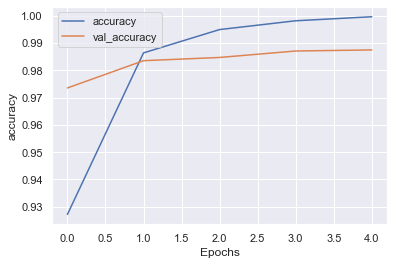

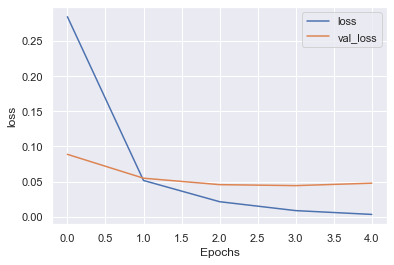

In [373]:
num_epochs = 10

early_stopping_callback_loss = tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 1)
early_stopping_callback_val_loss = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 1)

dnn_history = dnn_model.fit(train_padded, train_labels, epochs=num_epochs, validation_split = 0.2, \
                        callbacks = [early_stopping_callback_loss, early_stopping_callback_val_loss], verbose=1)

plot_graphs(dnn_history, "accuracy")
plot_graphs(dnn_history, "loss")

Les courbes d'apprentissage ci-dessus montrent que la courbe de perte diminue constamment puis devient presque stable. La différence extrêmement faible entre les données de formation et les données de validation montre également qu'il n'y a pas encore de surajustement découvert. Testons le modèle sur nos vecteurs de données de test.

In [374]:
dnn_results = dnn_model.evaluate(test_padded, test_labels, batch_size=128)

print('Regular dense network - test loss: {}'.format(dnn_results[0]))
print('Regular dense network - test accuracy: {}'.format(dnn_results[1]))

49/49 [==============================] - 0s 2ms/step - loss: 0.0425 - accuracy: 0.9879
Regular dense network - test loss: 0.04245120659470558
Regular dense network - test accuracy: 0.9878729581832886


In [375]:
dnn_pred = (dnn_model.predict(test_padded) >= 0.5).astype("int")

print("Un rapport détaillé sur les performances du modèle:")

print("Type de modèle: Réseau neuronal dense régulier.")
print(classification_report(test_labels, dnn_pred))

Un rapport détaillé sur les performances du modèle:
Type de modèle: Réseau neuronal dense régulier.
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2996
           1       0.99      0.99      0.99      3271

    accuracy                           0.99      6267
   macro avg       0.99      0.99      0.99      6267
weighted avg       0.99      0.99      0.99      6267



Nous obtenons un bon score F1 pour le modèle entraîné ci-dessus qui est égal à 0,98 pour les deux catégories.

In [376]:
print(confusion_matrix(test_labels, dnn_pred))

[[2962   34]
 [  42 3229]]


La matrice de confusion ci-dessus se traduit par :

Les Real News réelles et les Real News prédites: 3014 

Real News réelles mais Fake news prédites: 42 

Fake news réelles mais Real News prédites: 53 

Fake news réelles et Fake news prévues: 3158

La matrice de confusion ci-dessus montre qu'il existe un équilibre décent entre les vrais positifs, les faux positifs, les vrais négatifs et les faux négatifs.

## Réseau neuronal récurrent - LSTM

Le réseau de neurones ci-dessous contient une couche d'incorporation qui crée les embeddings de mots des vecteurs dans un espace dimensionnel embedding_dim.

In [377]:
# Réseau LSTM récurrent avec dimension d'embeddings de mots = 10

embedding_dim = 10

lstm_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.LSTM(12),
    tf.keras.layers.Dense(12, activation = "relu"),
    tf.keras.layers.Dense(1, activation = "sigmoid")
])

lstm_model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

Epoch 1/10
950/950 [==============================] - 155s 161ms/step - loss: 0.3866 - accuracy: 0.8144 - val_loss: 0.0667 - val_accuracy: 0.9795
Epoch 2/10
950/950 [==============================] - 159s 168ms/step - loss: 0.0287 - accuracy: 0.9921 - val_loss: 0.0604 - val_accuracy: 0.9797
Epoch 3/10
950/950 [==============================] - 133s 140ms/step - loss: 0.0110 - accuracy: 0.9978 - val_loss: 0.0583 - val_accuracy: 0.9836
Epoch 4/10
950/950 [==============================] - 180s 189ms/step - loss: 0.0044 - accuracy: 0.9992 - val_loss: 0.0821 - val_accuracy: 0.9829


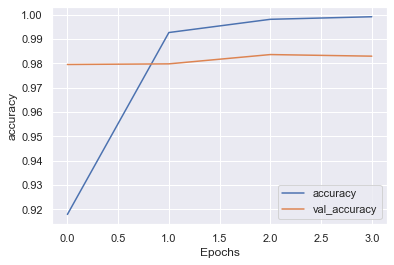

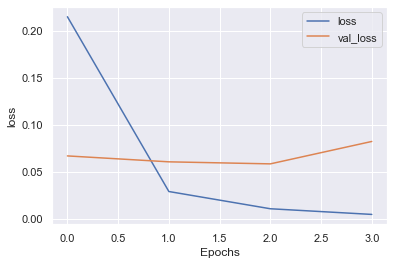

In [378]:
num_epochs = 10

early_stopping_callback_loss = tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 1)
early_stopping_callback_val_loss = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 1)

lstm_history = lstm_model.fit(train_padded, train_labels, epochs=num_epochs, validation_split = 0.2, \
                         callbacks = [early_stopping_callback_loss, early_stopping_callback_val_loss], verbose=1)

plot_graphs(lstm_history, "accuracy")
plot_graphs(lstm_history, "loss")

In [379]:
# Réseau LSTM récurrent avec dimension word-embeddings = 10

embedding_dim = 10

lstm_model = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.LSTM(12),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Dense(18, activation = "relu"),
    tf.keras.layers.Dense(1, activation = "sigmoid")
])

lstm_model.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

Epoch 1/10
950/950 [==============================] - 145s 141ms/step - loss: 0.3429 - accuracy: 0.8371 - val_loss: 0.0626 - val_accuracy: 0.9796
Epoch 2/10
950/950 [==============================] - 122s 128ms/step - loss: 0.0273 - accuracy: 0.9933 - val_loss: 0.0536 - val_accuracy: 0.9866
Epoch 3/10
950/950 [==============================] - 119s 126ms/step - loss: 0.0113 - accuracy: 0.9979 - val_loss: 0.0581 - val_accuracy: 0.9828


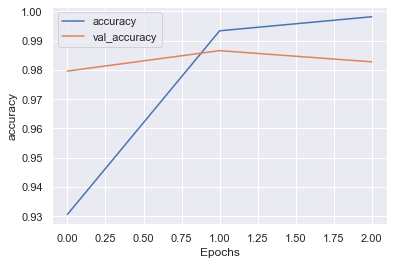

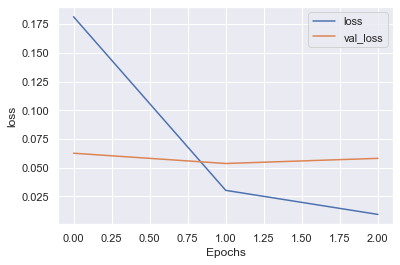

In [380]:
num_epochs = 10

early_stopping_callback_loss = tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 1)
early_stopping_callback_val_loss = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 1)

lstm_history = lstm_model.fit(train_padded, train_labels, epochs=num_epochs, validation_split = 0.2, \
                         callbacks = [early_stopping_callback_loss, early_stopping_callback_val_loss], verbose=1)

plot_graphs(lstm_history, "accuracy")
plot_graphs(lstm_history, "loss")

Les courbes d'apprentissage ci-dessus nous montrent que le processus de formation dans notre modèle LSTM mis à jour est bien meilleur par rapport au précédent. 

In [381]:
lstm_results = lstm_model.evaluate(test_padded, test_labels, batch_size=128)

print('LSTM Model - test loss: {}'.format(lstm_results[0]))
print('LSTM Model - test accuracy: {}'.format(lstm_results[1]))

49/49 [==============================] - 0s 8ms/step - loss: 0.0450 - accuracy: 0.9856
LSTM Model - test loss: 0.04495559632778168
LSTM Model - test accuracy: 0.9856390357017517


In [382]:
lstm_pred = (lstm_model.predict(test_padded) >= 0.5).astype("int")

print("Un rapport détaillé sur les performances du modèle:")

print("Model type: LSTM recurrent network.")
print(classification_report(test_labels, lstm_pred))

Un rapport détaillé sur les performances du modèle:
Model type: LSTM recurrent network.
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      2996
           1       0.99      0.98      0.99      3271

    accuracy                           0.99      6267
   macro avg       0.99      0.99      0.99      6267
weighted avg       0.99      0.99      0.99      6267



In [383]:
print(confusion_matrix(test_labels, lstm_pred))

[[2977   19]
 [  71 3200]]


La matrice de confusion ci-dessus se traduit par :

Real News réelles et Real News prévues: 2992 

Real News réelles mais Fake News prévues: 64 


Fake news réelles mais Real News prédites: 56 

Fake news réelles et Fake News prévues: 3155

La matrice de confusion ci-dessus montre qu'il existe un juste équilibre entre les vrais positifs, les faux positifs, les vrais négatifs et les faux négatifs.

Nous notons ainsi que notre réseau de neurones dense régulier a mieux fonctionné que notre modèle LSTM.

Nous avons créé un modèle prédisant si un article est un Fake News ou non à partir de son contenu textuel. Entraînons maintenant un réseau de neurones profond qui prédira si un article est un Fake News ou non à partir de son titre. Par conséquent, nous allons expérimenter avec un modèle sur le même.

# Modélisation sur le titre

In [384]:
all_news_data_title = df_true.append(df_fake, ignore_index = True)

all_news_data_processed_title = all_news_data_title.copy()

all_news_data_processed_title["title"] = all_news_data_processed_title["title"].apply(lambda x: remove_punctuations(x))
all_news_data_processed_title["title"] = all_news_data_processed_title["title"].apply(lambda x: remove_nums(x))
all_news_data_processed_title["title"] = all_news_data_processed_title["title"].apply(lambda x: remove_URL(x))
all_news_data_processed_title["title"] = all_news_data_processed_title["title"].apply(lambda x: remove_html(x))
all_news_data_processed_title["title"] = all_news_data_processed_title["title"].apply(lambda x: remove_emoji(x))
all_news_data_processed_title["title"] = all_news_data_processed_title["title"].apply(lambda x: clean_stopwords(x))

all_news_data_processed_title['label'] = all_news_data_processed_title['label'].map( {'Fake':1, 'True':0} )

del all_news_data_processed_title["text"]
del all_news_data_processed_title["subject"]
del all_news_data_processed_title["date"]

all_news_data_processed_title = all_news_data_processed_title[all_news_data_processed_title["title"].str.split().str.len().gt(0)]

all_news_data_processed_title = all_news_data_processed_title.sample(frac = 1).reset_index(drop=True).reset_index(drop = True)

all_news_data_processed_title.head(10)

,title,Cible,publisher,label
0,GENERAL BOYKIN On Gender Neutral Bathrooms “…t...,0,NaN,1
1,The NFL Puts Trump In A VERY Awkward Position ...,0,NaN,1
2,House Speaker Ryan wont endorse Trump authorit...,1,WASHINGTON (Reuters),0
3,HOLY FREEDOM OF SPEECH Obama’s Attorney Genera...,0,NaN,1
4,Trump heads home America First ringing Asian ears,1,MANILA (Reuters),0
5,TOO FUNNY CHUCK SCHUMER Tries To Lead Liberal ...,0,NaN,1
6,GAME OVER SNOWFLAKES TRUMP Channels Reagan…Thr...,0,NaN,1
7,MUSLIM FAMILY Swindles Millions From Taxpayers...,0,NaN,1
8,Five migrants die boat sinks Libyan coast guar...,1,TRIPOLI (Reuters),0
9,THE FIX IS IN JUDGE QUICKLY BLOCKS ABORTION VI...,0,NaN,1


In [385]:
tf.random.set_seed(100)

temp = [x for x in all_news_data_processed_title["title"].tolist()]
train_sentences_title = temp[:training_size]
test_sentences_title = temp[training_size:]

temp2 = [x for x in all_news_data_processed_title["label"].tolist()]
train_labels_title = temp2[:training_size]
test_labels_title = temp2[training_size:]


tokenizer = Tokenizer(num_words=vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(train_sentences)

word_index = tokenizer.word_index

train_sequences_title = tokenizer.texts_to_sequences(train_sentences_title)
train_padded_title = pad_sequences(train_sequences_title, maxlen=max_length, padding=padding_type, truncating=trunc_type)

test_sequences_title = tokenizer.texts_to_sequences(test_sentences_title)
test_padded_title = pad_sequences(test_sequences_title, maxlen=max_length, padding=padding_type, truncating=trunc_type)


train_padded_title = np.array(train_padded_title)
train_labels_title = np.array(train_labels_title)

test_padded_title = np.array(test_padded_title)
test_labels_title = np.array(test_labels_title)

Epoch 1/10
950/950 [==============================] - 63s 66ms/step - loss: 0.5892 - accuracy: 0.7537 - val_loss: 0.1183 - val_accuracy: 0.9717
Epoch 2/10
950/950 [==============================] - 62s 65ms/step - loss: 0.0883 - accuracy: 0.9797 - val_loss: 0.0599 - val_accuracy: 0.9795
Epoch 3/10
950/950 [==============================] - 62s 65ms/step - loss: 0.0438 - accuracy: 0.9882 - val_loss: 0.0463 - val_accuracy: 0.9821
Epoch 4/10
950/950 [==============================] - 61s 64ms/step - loss: 0.0292 - accuracy: 0.9911 - val_loss: 0.0409 - val_accuracy: 0.9874
Epoch 5/10
950/950 [==============================] - 60s 63ms/step - loss: 0.0220 - accuracy: 0.9937 - val_loss: 0.0355 - val_accuracy: 0.9868
Epoch 6/10
950/950 [==============================] - 60s 64ms/step - loss: 0.0162 - accuracy: 0.9957 - val_loss: 0.0332 - val_accuracy: 0.9889
Epoch 7/10
950/950 [==============================] - 60s 63ms/step - loss: 0.0130 - accuracy: 0.9962 - val_loss: 0.0319 - val_accuracy:

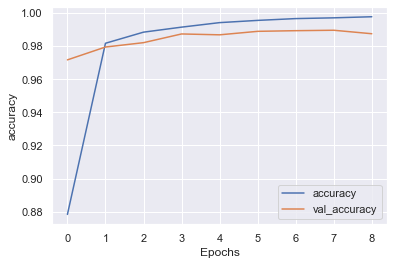

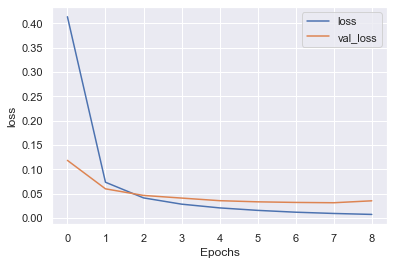

In [386]:
# Réseau de neurones dense régulier avec dimension d'embeddings de mots = 5.

embedding_dim = 5

dnn_model_title = tf.keras.Sequential([
    tf.keras.layers.Embedding(vocab_size, embedding_dim, input_length=max_length),
    tf.keras.layers.GlobalAveragePooling1D(),
    tf.keras.layers.Dense(24, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
dnn_model_title.compile(loss='binary_crossentropy',optimizer='adam',metrics=['accuracy'])

num_epochs_title = 10

early_stopping_callback_loss = tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 1)
early_stopping_callback_val_loss = tf.keras.callbacks.EarlyStopping(monitor = 'val_loss', patience = 1)

dnn_history_title = dnn_model_title.fit(train_padded_title, train_labels_title, epochs=num_epochs_title, validation_split=0.2,
                        callbacks = [early_stopping_callback_loss, early_stopping_callback_val_loss], verbose=1)

plot_graphs(dnn_history_title, "accuracy")
plot_graphs(dnn_history_title, "loss")

In [387]:
dnn_results_title = dnn_model_title.evaluate(test_padded_title, test_labels_title, batch_size=128)

print('Réseau dense régulier - test loss: {}'.format(dnn_results_title[0]))
print('Réseau dense régulier - test accuracy: {}'.format(dnn_results_title[1]))

54/54 [==============================] - 0s 843us/step - loss: 0.0348 - accuracy: 0.9881
Réseau dense régulier - test loss: 0.0347902812063694
Réseau dense régulier - test accuracy: 0.9881125092506409


In [388]:
dnn_pred_title = (dnn_model_title.predict(test_padded_title) >= 0.5).astype("int")

print("Un rapport détaillé sur les performances du modèle:")

print("Type de modèle: Réseau neuronal dense régulier.")
print(classification_report(test_labels_title, dnn_pred_title))

Un rapport détaillé sur les performances du modèle:
Type de modèle: Réseau neuronal dense régulier.
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      3370
           1       0.98      0.99      0.99      3528

    accuracy                           0.99      6898
   macro avg       0.99      0.99      0.99      6898
weighted avg       0.99      0.99      0.99      6898



In [481]:
print(confusion_matrix(test_labels_title, dnn_pred_title))

[[3310   60]
 [  22 3506]]


La matrice de confusion ci-dessus se traduit par:

Real News réelles et Real News prévues: 3273 

Real News réelles mais Fake News prévues: 39 

Fake news réelles mais Real News prévues: 32 

Fake news réelles et Fake News prévues: 3554

La matrice de confusion ci-dessus montre qu'il existe un juste équilibre entre les vrais positifs, les faux positifs, les vrais négatifs et les faux négatifs.


# Conclusion

Nous avons donc analysé l'ensemble des données sur la base de certaines métriques clés de données textuelles, expérimenté la modélisation d'apprentissage automatique en entraînant les données sur des bayes naïves multinomiales, pris en charge les classificateurs vectoriels, puis, nous avons construit des topics modeling à l'aide de la LDA de Gensim et visualisons des topics modeling. Enfin, nous avons vu comment agréger et présenter les résultats pour générer des informations qui peuvent être plus exploitables.